In [1]:
# importamos las librerias con las que vamos a trabajar
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu, f_oneway, kruskal, chi2_contingency
from matplotlib.ticker import FuncFormatter # para formatear los ejes
import plotly.express as px # para graficos interactivos
import plotly.graph_objects as go # para graficos interactivos

In [2]:
# leemos el dataset
data_df = pd.read_csv("data_salaries.csv", sep=";")

# mostramos las primeras filas del dataset
data_df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category
0,2025,EX,FT,Head of Data,348516,USD,348516,US,0,US,M,Leadership and Management
1,2025,EX,FT,Head of Data,232344,USD,232344,US,0,US,M,Leadership and Management
2,2025,SE,FT,Data Scientist,145400,USD,145400,US,0,US,M,Data Science and Research
3,2025,SE,FT,Data Scientist,81600,USD,81600,US,0,US,M,Data Science and Research
4,2025,MI,FT,Engineer,160000,USD,160000,US,100,US,M,Data Engineering


In [3]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151445 entries, 0 to 151444
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   work_year           151445 non-null  int64 
 1   experience_level    151445 non-null  object
 2   employment_type     151445 non-null  object
 3   job_title           151445 non-null  object
 4   salary              151445 non-null  int64 
 5   salary_currency     151445 non-null  object
 6   salary_in_usd       151445 non-null  int64 
 7   employee_residence  151445 non-null  object
 8   remote_ratio        151445 non-null  int64 
 9   company_location    151445 non-null  object
 10  company_size        151445 non-null  object
 11  job_category        151445 non-null  object
dtypes: int64(4), object(8)
memory usage: 13.9+ MB


Vemos que el dataset tiene 151.455 registros y 12 columnas. Analizaremos los datos por año y nos quedaremos con los datos de los años con mayor cantidad de datos. Luego analizaremos especialmente los datos del 2025.

In [4]:
# ver si hay valores nulos
data_df.isnull().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
job_category          0
dtype: int64

Análisis Univariante

Busco analizar la distribución de las variables:

In [5]:
cols_categoricas = ["work_year", "experience_level", "employment_type", "job_title", "salary_currency", "employee_residence", "remote_ratio", "company_location", "company_size", "job_category"]
cols_numericas = ["salary", "salary_in_usd"]

Variables categóricas:

- work_year

In [6]:
data_df.work_year.unique()

array([2025, 2024, 2023, 2022, 2020, 2021])

In [7]:
# Frecuencias con numeros
print("Frecuencias Absolutas:\n", data_df.work_year.value_counts())
print("Frecuencias Relativas: \n", data_df.work_year.value_counts(normalize = True) * 100)

Frecuencias Absolutas:
 work_year
2025    78726
2024    62241
2023     8524
2022     1661
2021      218
2020       75
Name: count, dtype: int64
Frecuencias Relativas: 
 work_year
2025    51.983228
2024    41.098088
2023     5.628446
2022     1.096768
2021     0.143947
2020     0.049523
Name: proportion, dtype: float64


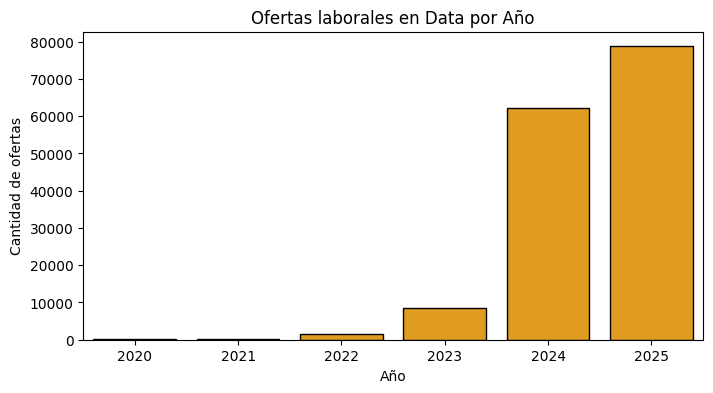

In [8]:
# Calcular frecuencias por año
year_counts = data_df["work_year"].value_counts().sort_index()

# Graficar
plt.figure(figsize=(8,4))
sns.barplot(x=year_counts.index, y=year_counts.values, color='orange', edgecolor='black')
plt.title('Ofertas laborales en Data por Año')
plt.xlabel('Año')
plt.ylabel('Cantidad de ofertas')
plt.show()

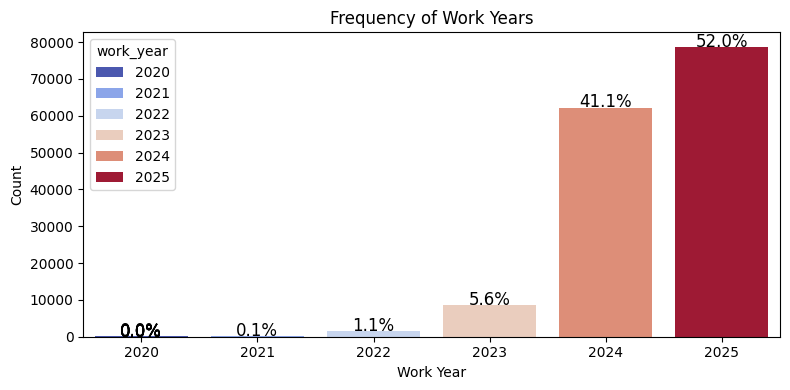

In [9]:
# Calcular la frecuencia y la proporción de ocurrencias para cada valor único en la columna "work_year"
data_work = data_df['work_year'].value_counts().reset_index()
data_work.columns = ['work_year', 'count']
data_work = data_work.sort_values(by='work_year', ascending=False)
data_work['proportion (%)'] = round(data_work['count'] / len(data_df) * 100, 1)

# Crear bar chart
plt.figure(figsize=(8, 4))
sns.barplot(x='work_year', y='count', data=data_work, hue='work_year', palette='coolwarm')
plt.title('Frequency of Work Years')
plt.xlabel('Work Year')
plt.ylabel('Count')

# Agregar labels
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x() + p.get_width() / 2., height + 10,
                   '{:.1f}%'.format((height / len(data_df)) * 100),
                   ha='center', fontsize=12)

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Vemos que aunque el dataset sea del 2020 al 2025, casi no tiene valores del 2020 al 2022 y tiene pocos valores del 2023. Por lo tanto, trabajaremos solo con los datos de los años 2024 y 2025.

In [10]:
data_df = data_df[data_df["work_year"].isin([2024, 2025])]

In [11]:
data_df["work_year"].value_counts().sort_index()

work_year
2024    62241
2025    78726
Name: count, dtype: int64

- job category

In [12]:
def frecuencias(df, columna_categorica, porcentaje = True):
    frec_abs = df[columna_categorica].value_counts() # Values_counts() me da las frecuencias absolutas
    frec_rel = df[columna_categorica].value_counts(normalize=True) * (100 if porcentaje else 1)  # Si activo el argumento normalize me da las relativas en tanto por 1, el argumento porcentaje de la función me permite pasarlo a tanto por cien

    # Crear DataFrame con ambas frecuencias
    frec_df = pd.DataFrame({'Frecuencia Absoluta': frec_abs, 'Frecuencia Relativa': frec_rel})

    return frec_df

In [13]:
# Valores numéricos:
df_frecuencias = frecuencias(data_df, "job_category")
df_frecuencias

,Frecuencia Absoluta,Frecuencia Relativa
job_category,,
Data Engineering,46643,33.087886
Data Science and Research,25607,18.165244
Data Analysis,18939,13.435059
Leadership and Management,18364,13.027162
Machine Learning and AI,12413,8.805607
Data Architecture and Modeling,4509,3.198621
Data Management and Strategy,4036,2.863081
BI and Visualization,3501,2.483560
Cloud and Database,2984,2.116807


                          job_category  count  proportion (%)
0                     Data Engineering  46643            33.1
1            Data Science and Research  25607            18.2
2                        Data Analysis  18939            13.4
3            Leadership and Management  18364            13.0
4              Machine Learning and AI  12413             8.8
5       Data Architecture and Modeling   4509             3.2
6         Data Management and Strategy   4036             2.9
7                 BI and Visualization   3501             2.5
8                   Cloud and Database   2984             2.1
9   General, Administrative & Training   2479             1.8
10         Data Quality and Operations    854             0.6
11         Business, Sales & Marketing    638             0.5


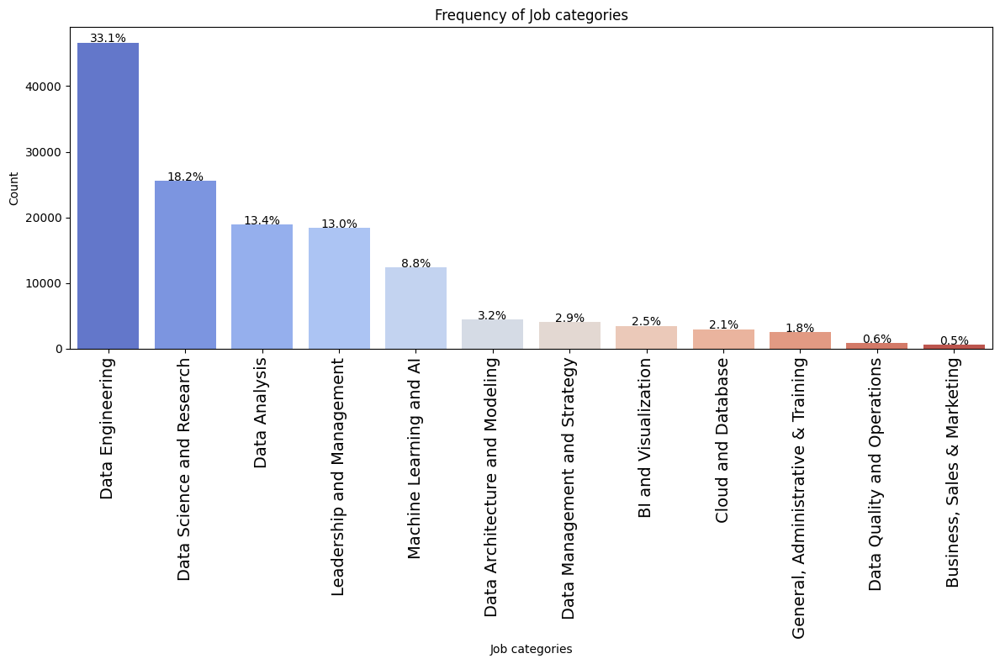

In [14]:
# Calcular la frecuencia y la proporción de ocurrencias para cada valor único en la columna "job_category"
data_job = data_df['job_category'].value_counts().reset_index()
data_job.columns = ['job_category', 'count']
data_job = data_job.sort_values(by='count', ascending=False)
data_job['proportion (%)'] = round(data_job['count'] / len(data_df) * 100, 1)

print(data_job)

# Crear bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='job_category', y='count', data=data_job, hue='job_category', palette='coolwarm')
plt.title('Frequency of Job categories')
plt.xlabel('Job categories')
plt.ylabel('Count')

# Agregar labels
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x() + p.get_width() / 2., height + 10,
                   '{:.1f}%'.format((height / len(data_df)) * 100),
                   ha='center', fontsize=10)

plt.xticks(rotation=90,fontsize=14)
plt.tight_layout()
# Save the plot to a file
#plt.savefig('/kaggle/working/job_categories.png')  # Saves the plot as a PNG file

plt.show()

El gráfico de barras muestra la frequencia para los años 2024 y 2025 de 12 categorias. "Data Engineering" es la mas importante representando el 33% de las ofertas laborales. Le siguen "Data Science and Research" con 18% y "Data Analysis" y "Leadership and Management" con 13% del total.

Por ejemplo, "Data Engineering" agrupa los siguientes roles:


In [15]:
# Filter the DataFrame for 'Data Engineering' job_category
data_engineering_df = data_df[data_df['job_category'] == 'Data Engineering']

# Count the frequency for each 'job_title'
data_engineering = data_engineering_df['job_title'].value_counts().reset_index()
data_engineering.columns = ['job_title', 'frequency']
data_engineering['proportion (%)'] = round(data_engineering['frequency'] / len(data_df) * 100, 1)

# Print the DataFrame
data_engineering.head(10)

,job_title,frequency,proportion (%)
0,Software Engineer,16948,12.0
1,Data Engineer,13961,9.9
2,Engineer,11004,7.8
3,Developer,1040,0.7
4,Software Developer,798,0.6
5,Software Development Engineer,746,0.5
6,Solutions Engineer,417,0.3
7,Backend Engineer,385,0.3
8,Full Stack Engineer,228,0.2
9,Member of Technical Staff,202,0.1


Vemos que hay muchos roles de software developer, que sería más acertado crear otra categoría que los agrupe con mejor precisión.
Ahora por ejemplo para "Data Science and Research":

In [16]:
# Filter the DataFrame for 'Data Science and Research' job_category
data_science_df = data_df[data_df['job_category'] == 'Data Science and Research']

# Count the frequency for each 'job_title'
data_science = data_science_df['job_title'].value_counts().reset_index()
data_science.columns = ['job_title', 'frequency']
data_science['proportion (%)'] = round(data_science['frequency'] / len(data_df) * 100, 1)

# Print the DataFrame
data_science.head(10)

,job_title,frequency,proportion (%)
0,Data Scientist,16290,11.6
1,Research Scientist,3147,2.2
2,Applied Scientist,2083,1.5
3,Research Engineer,1565,1.1
4,Research Analyst,383,0.3
5,Research Associate,260,0.2
6,Quantitative Analyst,221,0.2
7,Decision Scientist,178,0.1
8,Researcher,162,0.1
9,Statistician,129,0.1


Estos roles parecen adecuados en la categoria "Data Science and Research".

- experience_level

Para ver el nivel de manera ordenada buscamos crear una categoria con un orden definido.

In [17]:
data_df.experience_level.unique()

array(['EX', 'SE', 'MI', 'EN'], dtype=object)

EX: Executive

SE: Senior

MI: Mid-Level

EN: Entry Level

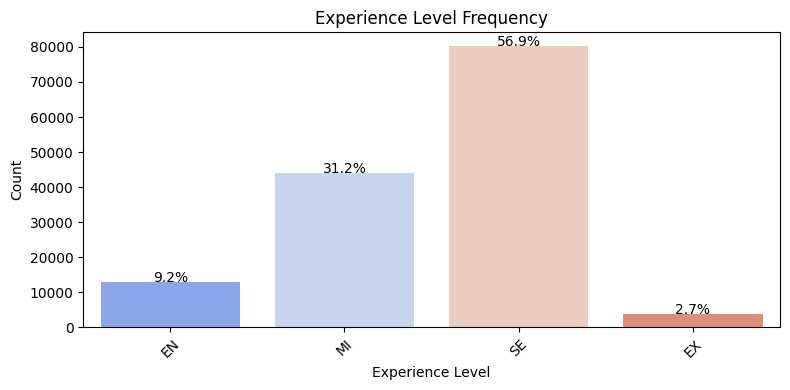

In [18]:
# Define the order of experience levels
experience_levels_order = ['EN', 'MI', 'SE', 'EX']

# Convert 'experience_level' to a category with a defined order
data_df['experience_level'] = pd.Categorical(data_df['experience_level'], categories=experience_levels_order, ordered=True)

# Count the frequency for each 'experience_level'
exp_level = data_df['experience_level'].value_counts().reset_index()

exp_level = exp_level.sort_values(by='experience_level', ascending=True)

exp_level.columns = ['experience_level', 'frequency']

exp_level['proportion (%)'] = round(exp_level['frequency'] / len(data_df) * 100, 1)

# Create a bar chart
plt.figure(figsize=(8, 4))
sns.barplot(x='experience_level', y='frequency', data=exp_level, hue='experience_level', palette='coolwarm')
plt.title('Experience Level Frequency')
plt.xlabel('Experience Level')
plt.ylabel('Count')

# Add percentage labels on top of each bar
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x() + p.get_width() / 2., height + 10,
                   '{:.1f}%'.format((height / len(data_df)) * 100),
                   ha='center', fontsize=10)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

La tabla presentada anteriormente indica que la mayoría de los empleados en la base de datos están clasificados como **Senior**. Por otro lado, solo un 9% de empleados se encuentra en el nivel **Entry-level**. Esto plantea la pregunta de por qué existe un desequilibrio tan marcado entre la cantidad de Seniors y los demás niveles.


Me interesa analizar qué puestos específicos (job_title) concentran más oportunidades entry-level en 2025 y qué porcentaje representan del total de ofertas para ese grupo:

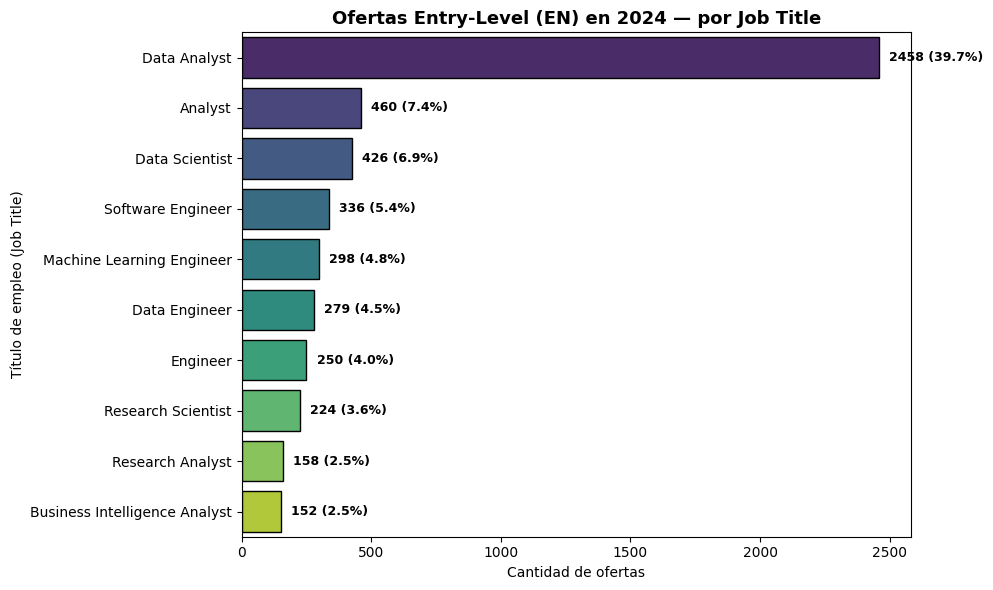

,job_title,count,percentage
0,Data Analyst,2458,39.74
1,Analyst,460,7.44
2,Data Scientist,426,6.89
3,Software Engineer,336,5.43
4,Machine Learning Engineer,298,4.82
5,Data Engineer,279,4.51
6,Engineer,250,4.04
7,Research Scientist,224,3.62
8,Research Analyst,158,2.55
9,Business Intelligence Analyst,152,2.46


In [19]:
# 1️⃣ Filtrar el dataset
data_en_2024 = data_df[(data_df["experience_level"] == "EN") & (data_df["work_year"] == 2024)]

# 2️⃣ Contar ofertas por job_title
job_counts = (
    data_en_2024["job_title"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "job_title"})
)

# 3️⃣ Calcular el porcentaje sobre el total
total_en = job_counts["count"].sum()
job_counts["percentage"] = (job_counts["count"] / total_en * 100).round(2)

# 4️⃣ Limitar a los 10 más frecuentes
top_jobs = job_counts.head(10)

# 5️⃣ Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_jobs,
    x="count",
    y="job_title",
    hue="job_title",
    palette="viridis",
    edgecolor="black"
)

# Etiquetas
for p in plt.gca().patches:
    count = p.get_width()
    job = p.get_y() + p.get_height() / 2
    pct = top_jobs.loc[top_jobs["count"] == count, "percentage"].values[0]
    plt.text(
        count + 40,  # 🔹 desplazamiento horizontal mayor
        job,
        f"{count:.0f} ({pct:.1f}%)",
        ha="left", va="center",
        fontsize=9, fontweight="bold"
    )

plt.title("Ofertas Entry-Level (EN) en 2024 — por Job Title", fontsize=13, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.tight_layout()
plt.show()

# 6️⃣ Mostrar la tabla ordenada
job_counts.head(10)

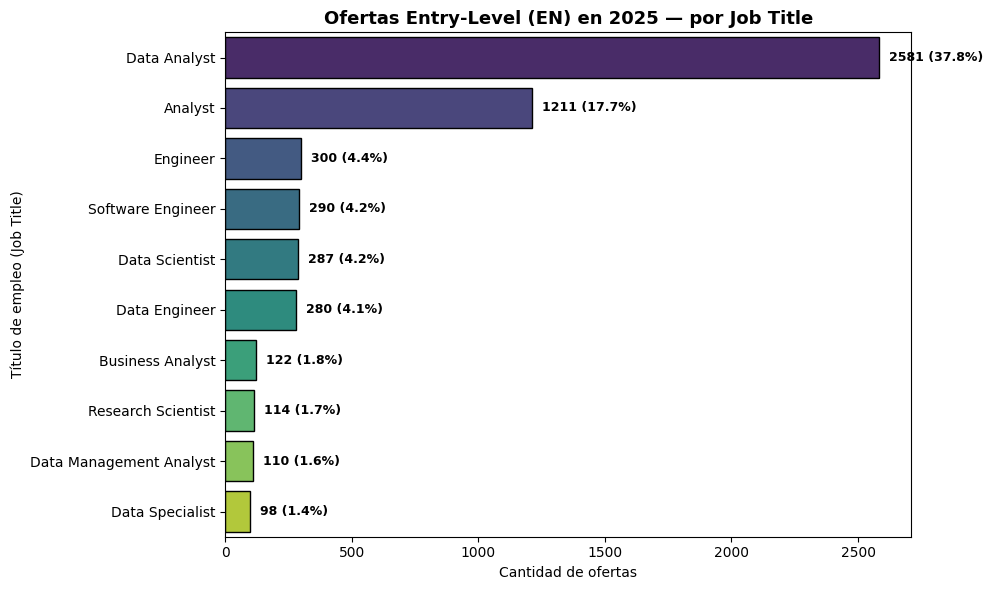

,job_title,count,percentage
0,Data Analyst,2581,37.80
1,Analyst,1211,17.74
2,Engineer,300,4.39
3,Software Engineer,290,4.25
4,Data Scientist,287,4.20
5,Data Engineer,280,4.10
6,Business Analyst,122,1.79
7,Research Scientist,114,1.67
8,Data Management Analyst,110,1.61
9,Data Specialist,98,1.44


In [20]:
# 1️⃣ Filtrar el dataset
data_en_2025 = data_df[(data_df["experience_level"] == "EN") & (data_df["work_year"] == 2025)]

# 2️⃣ Contar ofertas por job_title
job_counts = (
    data_en_2025["job_title"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "job_title"})
)

# 3️⃣ Calcular el porcentaje sobre el total
total_en = job_counts["count"].sum()
job_counts["percentage"] = (job_counts["count"] / total_en * 100).round(2)

# 4️⃣ Limitar a los 10 más frecuentes
top_jobs = job_counts.head(10)

# 5️⃣ Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_jobs,
    x="count",
    y="job_title",
    hue="job_title",
    palette="viridis",
    edgecolor="black"
)

# Etiquetas
for p in plt.gca().patches:
    count = p.get_width()
    job = p.get_y() + p.get_height() / 2
    pct = top_jobs.loc[top_jobs["count"] == count, "percentage"].values[0]
    plt.text(
        count + 40,  # 🔹 desplazamiento horizontal mayor
        job,
        f"{count:.0f} ({pct:.1f}%)",
        ha="left", va="center",
        fontsize=9, fontweight="bold"
    )

plt.title("Ofertas Entry-Level (EN) en 2025 — por Job Title", fontsize=13, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.tight_layout()
plt.show()

# 6️⃣ Mostrar la tabla ordenada
job_counts.head(10)


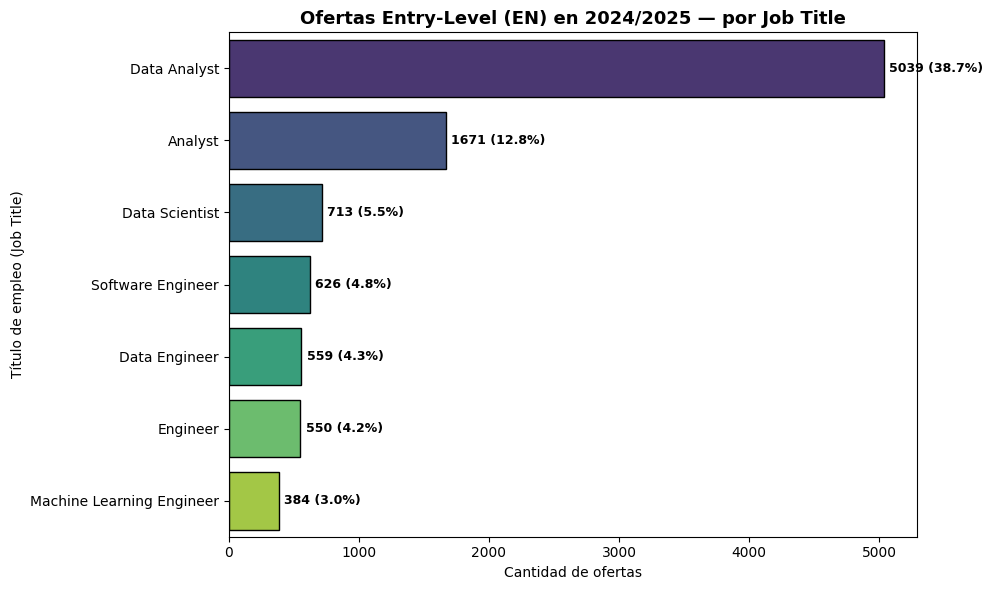

,job_title,count,percentage
0,Data Analyst,5039,38.72
1,Analyst,1671,12.84
2,Data Scientist,713,5.48
3,Software Engineer,626,4.81
4,Data Engineer,559,4.30
5,Engineer,550,4.23
6,Machine Learning Engineer,384,2.95


In [21]:
# 1️⃣ Filtrar el dataset
data_en = data_df[(data_df["experience_level"] == "EN")]

# 2️⃣ Contar ofertas por job_title
job_counts = (
    data_en["job_title"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "job_title"})
)

# 3️⃣ Calcular el porcentaje sobre el total
total_en = job_counts["count"].sum()
job_counts["percentage"] = (job_counts["count"] / total_en * 100).round(2)

# 4️⃣ Limitar a los 7 más frecuentes
top_jobs = job_counts.head(7)

# 5️⃣ Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_jobs,
    x="count",
    y="job_title",
    hue="job_title",
    palette="viridis",
    edgecolor="black"
)

# Etiquetas
for p in plt.gca().patches:
    count = p.get_width()
    job = p.get_y() + p.get_height() / 2
    pct = top_jobs.loc[top_jobs["count"] == count, "percentage"].values[0]
    plt.text(
        count + 40,  # 🔹 desplazamiento horizontal mayor
        job,
        f"{count:.0f} ({pct:.1f}%)",
        ha="left", va="center",
        fontsize=9, fontweight="bold"
    )

plt.title("Ofertas Entry-Level (EN) en 2024/2025 — por Job Title", fontsize=13, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.tight_layout()
plt.show()

# 6️⃣ Mostrar la tabla ordenada
job_counts.head(7)

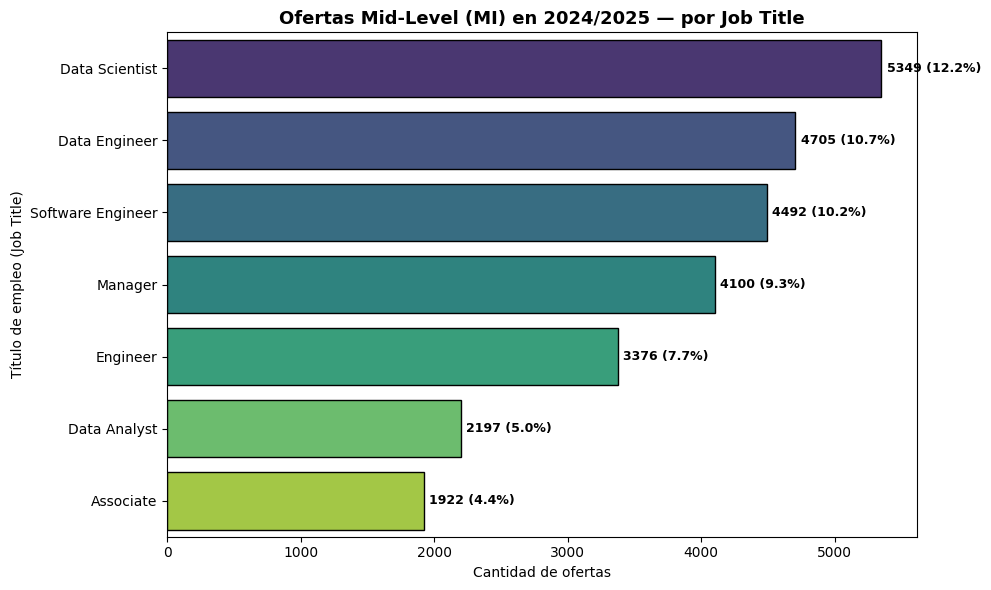

,job_title,count,percentage
0,Data Scientist,5349,12.18
1,Data Engineer,4705,10.71
2,Software Engineer,4492,10.22
3,Manager,4100,9.33
4,Engineer,3376,7.68
5,Data Analyst,2197,5.00
6,Associate,1922,4.37


In [22]:
# 1️⃣ Filtrar el dataset
data_mi = data_df[(data_df["experience_level"] == "MI")]

# 2️⃣ Contar ofertas por job_title
job_counts = (
    data_mi["job_title"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "job_title"})
)

# 3️⃣ Calcular el porcentaje sobre el total
total_mi = job_counts["count"].sum()
job_counts["percentage"] = (job_counts["count"] / total_mi * 100).round(2)

# 4️⃣ Limitar a los 7 más frecuentes
top_jobs = job_counts.head(7)

# 5️⃣ Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_jobs,
    x="count",
    y="job_title",
    hue="job_title",
    palette="viridis",
    edgecolor="black"
)

# Etiquetas
for p in plt.gca().patches:
    count = p.get_width()
    job = p.get_y() + p.get_height() / 2
    pct = top_jobs.loc[top_jobs["count"] == count, "percentage"].values[0]
    plt.text(
        count + 40,  # 🔹 desplazamiento horizontal mayor
        job,
        f"{count:.0f} ({pct:.1f}%)",
        ha="left", va="center",
        fontsize=9, fontweight="bold"
    )

plt.title("Ofertas Mid-Level (MI) en 2024/2025 — por Job Title", fontsize=13, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.tight_layout()
plt.show()

# 6️⃣ Mostrar la tabla ordenada
job_counts.head(7)

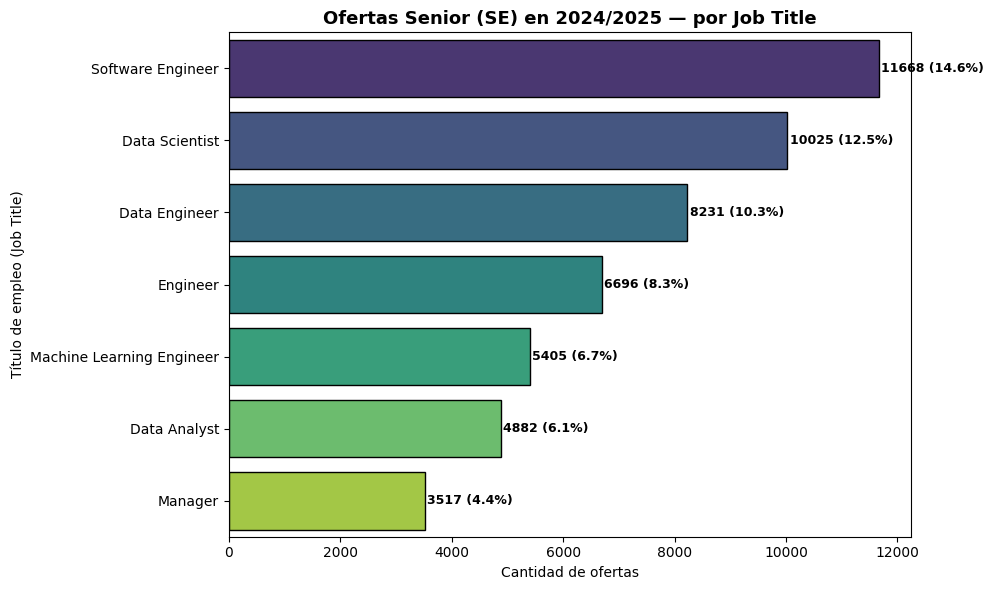

,job_title,count,percentage
0,Software Engineer,11668,14.56
1,Data Scientist,10025,12.51
2,Data Engineer,8231,10.27
3,Engineer,6696,8.35
4,Machine Learning Engineer,5405,6.74
5,Data Analyst,4882,6.09
6,Manager,3517,4.39


In [23]:
# 1️⃣ Filtrar el dataset
data_se = data_df[(data_df["experience_level"] == "SE")]

# 2️⃣ Contar ofertas por job_title
job_counts = (
    data_se["job_title"]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "job_title"})
)

# 3️⃣ Calcular el porcentaje sobre el total
total_se = job_counts["count"].sum()
job_counts["percentage"] = (job_counts["count"] / total_se * 100).round(2)

# 4️⃣ Limitar a los 7 más frecuentes
top_jobs = job_counts.head(7)

# 5️⃣ Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_jobs,
    x="count",
    y="job_title",
    hue="job_title",
    palette="viridis",
    edgecolor="black"
)

# Etiquetas
for p in plt.gca().patches:
    count = p.get_width()
    job = p.get_y() + p.get_height() / 2
    pct = top_jobs.loc[top_jobs["count"] == count, "percentage"].values[0]
    plt.text(
        count + 40,  # 🔹 desplazamiento horizontal mayor
        job,
        f"{count:.0f} ({pct:.1f}%)",
        ha="left", va="center",
        fontsize=9, fontweight="bold"
    )

plt.title("Ofertas Senior (SE) en 2024/2025 — por Job Title", fontsize=13, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.tight_layout()
plt.show()

# 6️⃣ Mostrar la tabla ordenada
job_counts.head(7)

Cuantas ofertas hubo en 2024 y cuantas hay hasta ahora en 2025?

In [24]:
data_df.work_year.value_counts()

work_year
2025    78726
2024    62241
Name: count, dtype: int64

Aun restando algunos meses para terminar el 2025, esto podría indicar que la demanda de roles de data está en aumento.

Quiero ver cual es el job title con más ofertas en el 2024 y en 2025 en total y por experience level.

In [25]:
# Agrupar por año y job_title
top_jobs_by_year = (
    data_df
    .groupby(["work_year", "job_title"])
    .size()
    .reset_index(name="count")
)

# Seleccionar el top 1 por año
top_job_each_year = top_jobs_by_year.loc[top_jobs_by_year.groupby("work_year")["count"].idxmax()]
top_job_each_year


,work_year,job_title,count
124,2024,Data Scientist,8932
536,2025,Software Engineer,9191


El puesto más demandado en 2024 fue Data Scientist mientras que en 2025 hasta la fecha es Software Engineer.

In [26]:
# Agrupar por año, nivel de experiencia y job_title
top_jobs_by_year_exp = (
    data_df
    .groupby(["work_year", "experience_level", "job_title"], observed=True)
    .size()
    .reset_index(name="count")
)

# Seleccionar el top 1 por cada combinación (año + experiencia)
top_job_each_level = top_jobs_by_year_exp.loc[
    top_jobs_by_year_exp.groupby(["work_year", "experience_level"], observed=True)["count"].idxmax()
]

# Traducir niveles a etiquetas legibles
labels = {
    "EN": "Entry-level",
    "MI": "Mid-level",
    "SE": "Senior",
    "EX": "Executive"
}
top_job_each_level["experience_label"] = top_job_each_level["experience_level"].astype(str).replace(labels)

# Ordenar por año y nivel
top_job_each_level = top_job_each_level.sort_values(["work_year", "experience_level"])
top_job_each_level


,work_year,experience_level,job_title,count,experience_label
34,2024,EN,Data Analyst,2458,Entry-level
205,2024,MI,Data Scientist,3082,Mid-level
385,2024,SE,Data Scientist,5301,Senior
509,2024,EX,Data Engineer,252,Executive
594,2025,EN,Data Analyst,2581,Entry-level
837,2025,MI,Manager,2790,Mid-level
1139,2025,SE,Software Engineer,6398,Senior
1204,2025,EX,Director,616,Executive


Como vimos anteriormente, para Entry Level Data Analyst es el puesto con más ofertas en ambos años.
En Mid-Level y Senior, en 2024 el más demandado fue Data Scientist. En cambio en 2025, fueron Manager en Mid-Level y Software Engineer en Senior.
Para Executives, los más demandados fueron Data Engineer y Director, en 2024 y 2025, respectivamente.

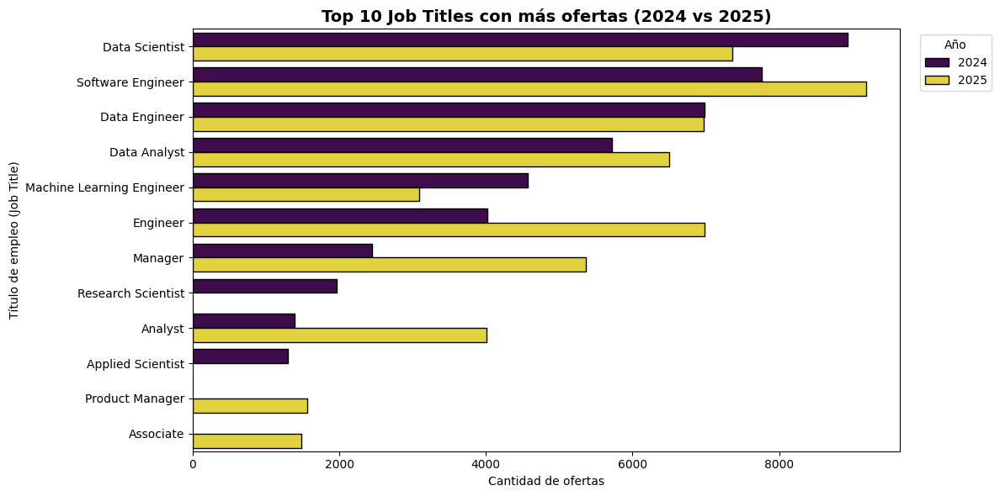

In [27]:
# === Top job title por año ===
top_jobs_by_year = (
    data_df.groupby(["work_year", "job_title"])
    .size()
    .reset_index(name="count")
)

# Obtener el top 10 por año para graficar
top10_by_year = (
    top_jobs_by_year
    .sort_values(["work_year", "count"], ascending=[True, False])
    .groupby("work_year")
    .head(10)
)

# === Gráfico 1: Top 10 job titles por año ===
plt.figure(figsize=(12, 6))
sns.barplot(
    data=top10_by_year,
    x="count",
    y="job_title",
    hue="work_year",
    palette="viridis",
    edgecolor="black"
)

plt.title("Top 10 Job Titles con más ofertas (2024 vs 2025)", fontsize=14, fontweight="bold")
plt.xlabel("Cantidad de ofertas")
plt.ylabel("Título de empleo (Job Title)")
plt.legend(title="Año", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


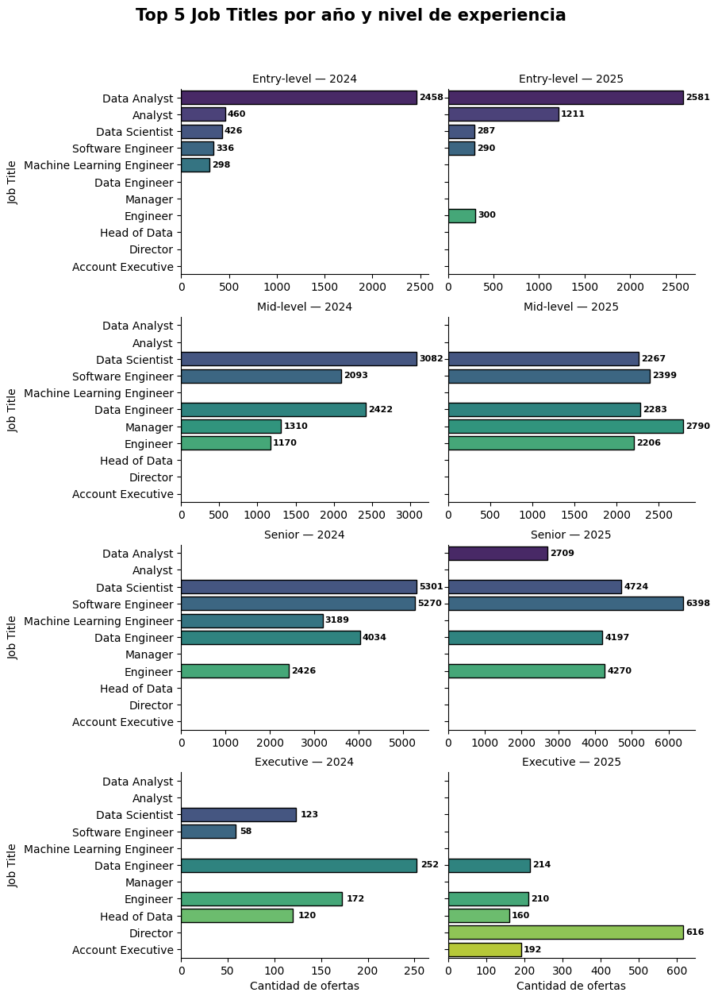

In [28]:
# === Top job title por año y nivel de experiencia ===
top_jobs_by_year_exp = (
    data_df.groupby(["work_year", "experience_level", "job_title"], observed=True)
    .size()
    .reset_index(name="count")
)

# Obtener el top 5 por (año, nivel)
top5_each_level = (
    top_jobs_by_year_exp
    .sort_values(["work_year", "experience_level", "count"], ascending=[True, True, False])
    .groupby(["work_year", "experience_level"], observed=True)
    .head(5)
    .copy()
)

# Etiquetas legibles
labels = {"EN": "Entry-level", "MI": "Mid-level", "SE": "Senior", "EX": "Executive"}
top5_each_level["experience_label"] = top5_each_level["experience_level"].astype(str).replace(labels)

# === Gráfico 2: Top 5 por año y experiencia ===
g = sns.catplot(
    data=top5_each_level,
    x="count",
    y="job_title",
    col="work_year",
    row="experience_label",
    kind="bar",
    height=3.2,
    aspect=1.4,
    hue="job_title",
    palette="viridis",
    edgecolor="black",
    sharex=False
)

g.set_titles("{row_name} — {col_name}")
g.set_axis_labels("Cantidad de ofertas", "Job Title")
g.fig.subplots_adjust(top=0.90)
g.fig.suptitle("Top 5 Job Titles por año y nivel de experiencia", fontsize=15, fontweight="bold")

# Agregar etiquetas con el valor de cada barra (sin espacios en blanco)
for ax in g.axes.flat:
    xmax = ax.get_xlim()[1]
    offset = max(5, xmax * 0.01)
    for p in ax.patches:
        w = p.get_width()
        if np.isfinite(w) and w > 0:
            ax.text(
                w + offset,
                p.get_y() + p.get_height() / 2,
                f"{int(w)}",
                va="center", ha="left",
                fontsize=8, fontweight="bold"
            )

plt.show()


- employment_type

In [29]:
data_df.employment_type.unique()

array(['FT', 'PT', 'CT', 'FL'], dtype=object)

FT: Full Time

PT: Part Time

CT: Contract

FL: Freelance

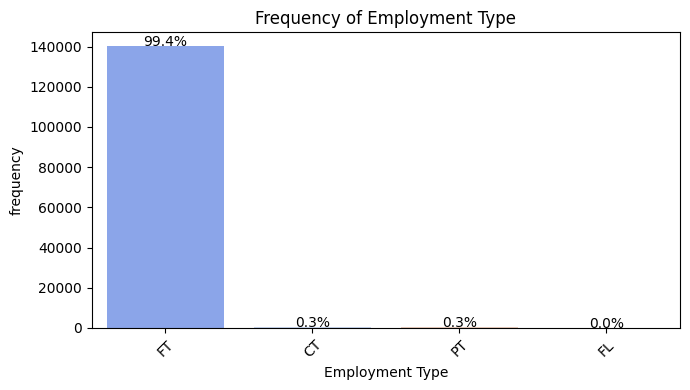

In [30]:
# Count the frequency for each 'employment_type'
emp_type = data_df['employment_type'].value_counts().reset_index()
emp_type.columns = ['employment_type', 'frequency']
emp_type['proportion (%)'] = round(emp_type['frequency'] / len(data_df) * 100, 1)

# Sort the DataFrame by frequency in descending order
emp_type = emp_type.sort_values(by='frequency', ascending=False)

# Create a bar chart
plt.figure(figsize=(7, 4))
sns.barplot(x='employment_type', y='frequency', data=emp_type, hue='employment_type', palette='coolwarm')
plt.title('Frequency of Employment Type')
plt.xlabel('Employment Type')
plt.ylabel('frequency')

# Add percentage labels on top of each bar
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x() + p.get_width() / 2., height + 10,
                   '{:.1f}%'.format((height / len(data_df)) * 100),
                   ha='center', fontsize=10)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

El gráfico de barras ofrece un desglose detallado de los tipos de ofertas laborales disponibles. Según los datos, del total de registros, el **99,4 %** corresponde a puestos **full time**. Esto sugiere que los trabajos a tiempo completo son el tipo de empleo más demandado y comúnmente disponible.


- company_location

Si queremos analizar los 10 paises en los que se registran la mayor cantidad de ofertas laborales en este rubro

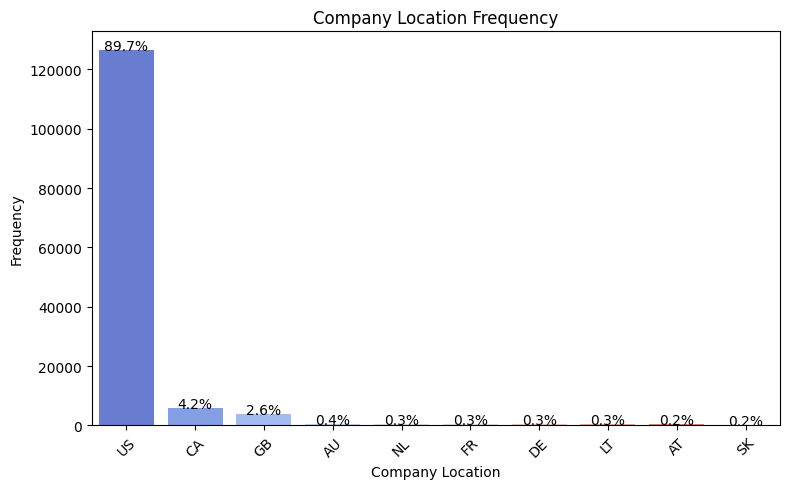

In [31]:
# Create a summary table
result_df = data_df['company_location'].value_counts().reset_index()
result_df.columns = ['company_location', 'frequency']

# Sort the DataFrame by frequency in descending order
result_df = result_df.sort_values(by='frequency', ascending=False)

result_df = result_df.iloc[:10]

# Add the 'proportion (%)' column
result_df['proportion (%)'] = round(result_df['frequency'] / len(data_df) * 100, 1)

# Create a bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x='company_location', y='frequency', data=result_df, hue='company_location', palette='coolwarm')
plt.title('Company Location Frequency')
plt.xlabel('Company Location')
plt.ylabel('Frequency')

# Add percentage labels on top of each bar
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x() + p.get_width() / 2., height + 10,
                   '{:.1f}%'.format((height / len(data_df)) * 100),
                   ha='center', fontsize=10)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Estados Unidos es el pais con mayor demanda representando el casi el 90% de los datos obtenidos del dataset. Esto se debe problablemente a que la mayoria de los datos fueron tomados de busquedas de empresas de este país. Le sigue Canada con apenas un 4.2%  y Gran Bretaña con 2.6%.

In [32]:
data_df['company_location'].value_counts()

company_location
US    126494
CA      5958
GB      3685
AU       565
NL       460
       ...  
NG         1
PK         1
SA         1
BA         1
AS         1
Name: count, Length: 83, dtype: int64

Dado que de los unicos paises que hay suficiente cantidad de registros son Estados Unidos, Canada y Gran Bretaña, se enfocará el análisis unicamente en esos paises.

In [33]:
paises_a_analizar = ['US', 'CA', 'GB']
data_df_location = data_df[data_df['company_location'].isin(paises_a_analizar)]

El dataframe data_df_location lo utilizaremos para futuros análisis más adelante.

- company size y remote ratio

In [34]:
data_df.company_size.unique()

array(['M', 'L', 'S'], dtype=object)

S: Small

M: Medium

L: Large

In [35]:
data_df.remote_ratio.unique()

array([  0, 100,  50])

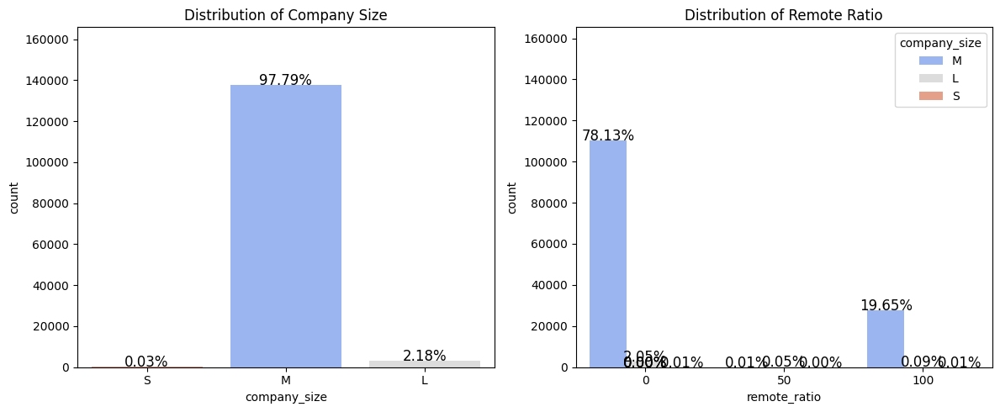

In [36]:
# Determine the maximum count for both columns
max_count = 1.2* max(data_df['company_size'].value_counts().max(), data_df['remote_ratio'].value_counts().max())

# Create side-by-side bar plots
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.countplot(x='company_size', data=data_df, hue='company_size', palette='coolwarm', order=['S', 'M', 'L'])
plt.title('Distribution of Company Size')
plt.ylim(0, max_count+500)  # Set y-axis range

# Add percentage labels for company_size
total = float(len(data_df['company_size']))
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x()+p.get_width()/2.,
            height + 10,
            '{:.2f}%'.format((height/total)*100),
            ha="center", fontsize=12)

plt.subplot(1, 2, 2)
sns.countplot(x='remote_ratio', data=data_df, hue='company_size', palette='coolwarm', order=[0, 50, 100])
plt.title('Distribution of Remote Ratio')
plt.ylim(0, max_count)  # Set y-axis range

# Add percentage labels for remote_ratio
total = float(len(data_df['remote_ratio']))
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x()+p.get_width()/2.,
            height + 10,
            '{:.2f}%'.format((height/total)*100),
            ha="center", fontsize=12)

plt.tight_layout()
plt.show()

Los graficos muestran que las empresas de tamaño medio (**"M"**) representan casi el **98 %** de los registros. En cuanto al **entorno de trabajo**, el más común sigue siendo el **presencial**, que abarca el **80 %** del total, seguido por el **100% remoto**, con un magro **19,7 %**. En estos registros casi no hay ofertas de trabajo hibrido ni de pequeñas empresas.


Variables numéricas:

In [37]:
data_df.salary_currency.unique()

array(['USD', 'EUR', 'GBP', 'CAD', 'INR', 'AUD', 'PLN', 'CHF', 'SGD',
       'CZK', 'NOK', 'MXN', 'PHP', 'JPY', 'HUF', 'TWD', 'BRL', 'ZAR',
       'DKK', 'ILS', 'TRY', 'SEK', 'NZD'], dtype=object)

Haremos el analisis en moneda USD ya que contamos con una columna con todos los salarios en esa moneda para tener una moneda homogenea para poder comparar.

- salary_in_usd

In [38]:
# calculo de las principales medidas para la columna salario en dolares
g = data_df[["salary_in_usd"]]
desc = g.describe()
median_row = g.median()
desc.loc['median'] = median_row
mode_row = g.mode().iloc[0]
desc.loc['mode'] = mode_row
cv_row = (g.std(ddof=1) / g.mean()) * 100
desc.loc['CV'] = cv_row
desc.loc['IQR'] = desc.loc['75%'] - desc.loc['25%']
order = ['count', 'mean', 'median', 'mode', 'std', 'CV', 'min', '25%', '50%', '75%', 'max', 'IQR']
desc = desc.loc[order]
desc

,salary_in_usd
count,140967.000000
mean,158153.965737
median,147000.000000
mode,160000.000000
std,74727.351345
CV,47.249749
min,15107.000000
25%,106000.000000
50%,147000.000000
75%,199400.000000


De esta tabla, vemos que:

- El salario promedio ronda los 158 mil USD anuales.
- La mitad de los trabajadores gana menos que 147 mil USD anuales. El promedio (158 k) es mayor que la mediana (147 k), lo que indica asimetria positiva: hay sueldos muy altos que elevan la media. Esto es típico en el sector tech/data: hay amplia brecha entre perfiles junior y senior/manager.
- La moda es 160 mil, es el valor mas frecuente, lo que muestra que la mayoria ronda ese rango.
- La desviacion estandar (74 k) es muy alta. Los salarios varían muchisimo entre roles, regiones, o años. 
- El coeficiente de variación de 47 % implica que los salarios varían casi la mitad de su valor medio. Esto es muy alto pero esperado en un dataset con tantos niveles y países. Veremos luego como acotar los datos a analizar.
- El minimo es de 15 mil, posiblemente pasantia.
- El maximo es de 800 mil, es extremadamente alto, debe ser un posible outlier. A priori conviene desestimarlo ya que no aporta para el analisis.
- Q1: El 25% gana menos de 106 mil.
- Q2: El 50% gana menos de 147 mil.
- Q3: El 75% gana menos de 199 mil. El 25% superior gana mas de 199 mil.

- IQR: Rango intercuartílico representativo del “mercado real”

Se puede observar que la mayoria de los salarios se concentra entre 100 k y 200 k USD anuales, que podría considerarse el rango de compensación típica internacional para roles de Data Analyst, Data Engineer y Data Scientist.

Graficamos el histograma de salary_in_usd para mostrar la distribución y el rango de los salarios entre las distintas categorías de empleo, identificando además la tendencia central y los outliers.

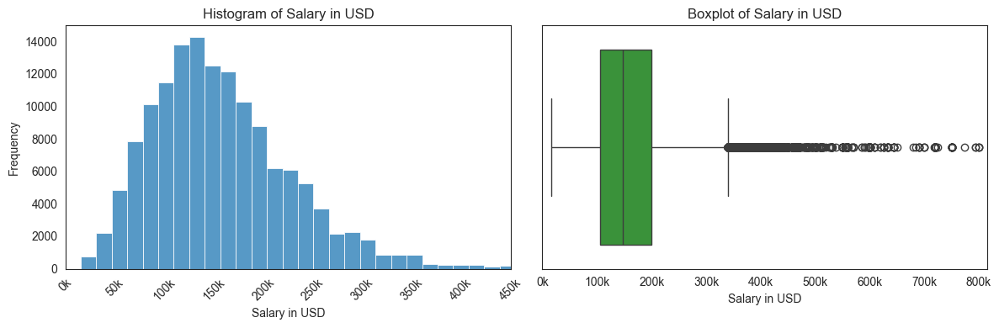

In [39]:
# Configuración general
sns.set_style('white')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# === HISTOGRAMA ===
sns.histplot(data=data_df, x='salary_in_usd', bins=50, ax=ax1, color='#1f77b4')
ax1.set_xlim(0, 450000)
ax1.set_title('Histogram of Salary in USD')
ax1.set_xlabel('Salary in USD')
ax1.set_ylabel('Frequency')

# Formato en miles
formatter = FuncFormatter(lambda x, _: f'{x/1000:,.0f}k')
ax1.xaxis.set_major_formatter(formatter)

# Etiquetas del eje X legibles
ax1.tick_params(axis='x', rotation=45)
ax1.margins(x=0.02)

# === BOXPLOT ===
sns.boxplot(data=data_df, x='salary_in_usd', ax=ax2, color='#2ca02c')
ax2.set_title('Boxplot of Salary in USD')
ax2.set_xlabel('Salary in USD')
ax2.set_ylabel('')
ax2.xaxis.set_major_formatter(formatter)
ax2.margins(x=0.02)

plt.tight_layout()
plt.show()


El histograma muestra una ligera asimetría positiva, aunque mantiene una forma aproximadamente normal (en campana), lo que sugiere que la distribución de salary_in_usd es cercana a una distribución normal.

Conocer la posición de los valores dentro de una distribución normal facilita la detección de outliers, la cual es esencial, ya que los valores extremos —a menudo originados por errores en la recolección o el procesamiento de datos— pueden distorsionar los resultados y afectar la validez del análisis estadístico.

Analisis Multivariante

Esta sección presenta la correlación entre variables, es decir, cómo determinadas columnas o variables influyen en el salario promedio en USD. Se utilizarán visualizaciones como el mapa de calor (heatmap) y el diagrama de violín (violin plot) para mostrar las correlaciones entre job_category, company_location, experience_level, company_size y remote_ratio.

Salario promedio por job_category y experience_level

Para este análisis, me enfoqué únicamente en las ofertas del 2025 a **tiempo completo**, ya que representan el **99,4 %** del total. Este tipo de empleo es el **más comúnmente buscado** por los profesionales. Cualquier otro tipo de empleo, como **tiempo parcial** o **freelance**, fue considerado pero **no incluido en el análisis estadístico**. En cuanto a la ubicación de la empresa, nos centraremos en aquellas situadas en Estados Unidos, Canada y Gran Bretaña que es de donde se tienen la sufiente cantidad de datos para analizar.

---

**Pasos de manipulación de datos para el mapa de calor:**

1. **Transformar** la columna `experience_level` en una variable **categórica con un orden definido**.
2. **Crear una tabla resumen** con el **salario anual promedio** agrupado por `job_category` y `experience_level`.
3. **Generar un mapa de calor (heat map)** utilizando el **salario anual promedio en USD**.


In [40]:
# Filtering the DataFrame for 'Full-time' employment type, 2025 for US, CA y GB
data_full_time_2025 = data_df[(data_df['employment_type'] == 'FT') & (data_df['work_year'] == 2025) & (data_df['company_location'].isin(['US', 'CA', 'GB']))]

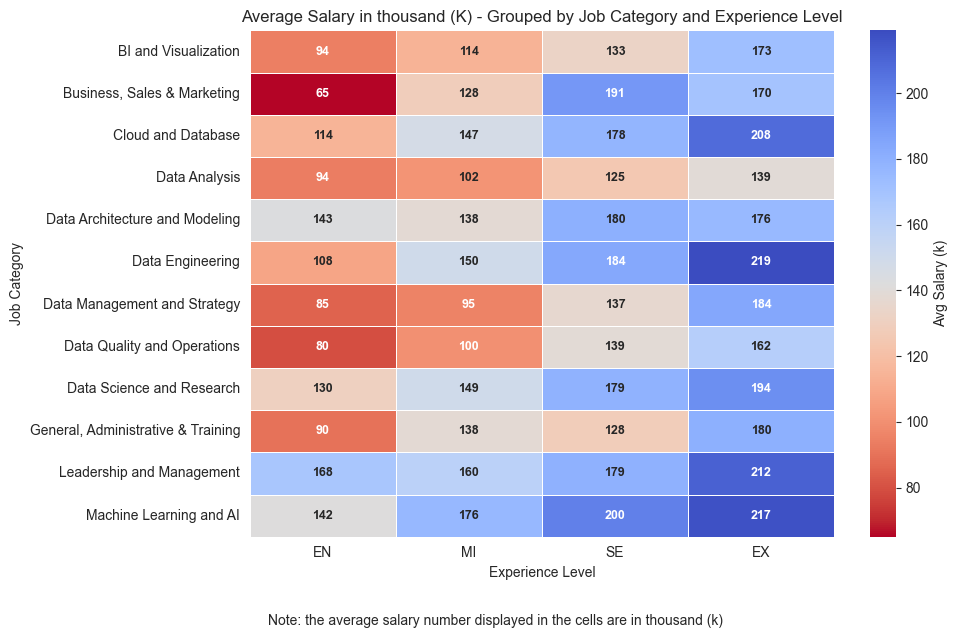

In [41]:
# Create a DataFrame with the average salary grouped by 'job_category' and 'experience_level'
summary_table = data_full_time_2025.groupby(['job_category', 'experience_level'], observed=True).agg(average_salary=('salary_in_usd', 'mean')).reset_index()

#print(summary_table)

# Convert the 'average_salary' to thousands (k) in the summary table
summary_table['average_salary'] = (summary_table['average_salary'] / 1000).round(1)

# Resize the plot
plt.figure(figsize=(10, 6))

# Create a heatmap using seaborn with customized annotation format and text size
sns.heatmap(data=summary_table.pivot_table(index='job_category', columns='experience_level', values='average_salary', observed=True),
            annot=True, fmt=".0f", linewidths=.5, cmap="coolwarm_r", cbar_kws={'label': 'Avg Salary (k)'},
            annot_kws={'size': 9, 'fontweight': 'bold'})  # Set fmt=".1f" to display one decimal place

# Customize plot elements
plt.title('Average Salary in thousand (K) - Grouped by Job Category and Experience Level')
plt.xlabel('Experience Level')
plt.ylabel('Job Category')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
# Add a caption
caption_text = "Note: the average salary number displayed in the cells are in thousand (k)"
plt.figtext(0.5, -0.05, caption_text, wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()

# Save the plot to a file
#plt.savefig('/kaggle/working/heatmap.png')  # Saves the plot as a PNG file

# Show the plot
plt.show()

El mapa de calor (heatmap) muestra el salario promedio mediante una escala de colores que va del rojo (más bajo) al azul (más alto). Cada celda contiene el salario promedio expresado de forma simplificada en miles (k).

Con base en los resultados del mapa de calor, se pueden realizar las siguientes observaciones:

En general, el salario promedio aumenta con el nivel de experiencia en la mayoría de las categorías laborales.

Los salarios promedio más altos del 2025 para un puesto de nivel inicial (entry-level) corresponden a las categoría Leadership and Management (168 k), Data Architecture and Modeling (143 k), Machine Learning and AI (142 k), y Data Science and Research (130 k). A simple vista parecen salarios altos para ser entry level. Para puestos más comunmente considerados entry level como por ejemplo Data Analysis, el salario promedio es de 94 k.

Los salarios más elevados en general corresponden a los puestos ejecutivos de Data Engineering, Machine Learning and AI y Leadership and Management.

Bubble chart:

Los puntos grandes indican roles más frecuentes.
El eje vertical muestra los salarios promedio.
El color agrupa por Job Category, lo que permite comparar visualmente cómo evoluciona cada área con la experiencia.

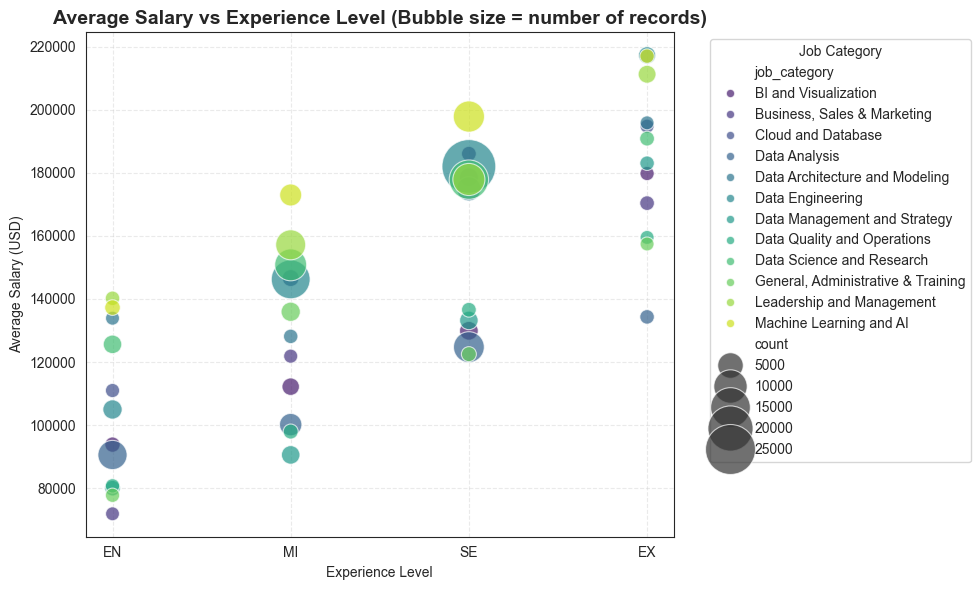

In [42]:
# Agrupar para calcular salario promedio y cantidad de registros
bubble_df = (
    data_df.groupby(["experience_level", "job_category"], observed=True)
    .agg(avg_salary=("salary_in_usd", "mean"),
         count=("salary_in_usd", "size"))
    .reset_index()
)

plt.figure(figsize=(10,6))
sns.scatterplot(
    data=bubble_df,
    x="experience_level",
    y="avg_salary",
    size="count",
    hue="job_category",
    sizes=(100, 1500),
    alpha=0.7,
    palette="viridis"
)

plt.title("Average Salary vs Experience Level (Bubble size = number of records)", fontsize=14, weight="bold")
plt.xlabel("Experience Level")
plt.ylabel("Average Salary (USD)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Job Category")
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


Scatter plot: salary_in_usd x job_category x experience_level

El scatter plot muestra todos los puntos usados para el heatmap creado anteriormente.

In [43]:
# Sort the DataFrame by 'experience_level'
data_full_time_2025 = data_full_time_2025.sort_values(by='experience_level', ascending=True)

# Create an interactive strip plot with jitter
fig = px.strip(data_full_time_2025, x='job_category', y='salary_in_usd', color='experience_level', hover_data=['company_location', 'job_title', 'employment_type', 'remote_ratio', 'company_size'], title='Salary vs Job Category')

# Rotate x-axis labels
fig.update_layout(xaxis_tickangle=45)

# Update the size and shape of the data points
fig.update_traces(marker=dict(size=5, opacity=0.6))

# Update axis titles and legend title
fig.update_layout(xaxis_title='Job Category',
                  yaxis_title='Salary in USD',
                  legend_title='Experience Level')

# Increase resolution and height
fig.update_layout(width=800, height=600)

# Show the plot
fig.show()

**Análisis de las tendencias salariales para puestos de Data Analysis Entry-Level**

Esta sección se centra en el **subgrupo de Data Analysis en nivel Entry-level**, ya que se busca comprender cómo distintos factores —como el **nivel de experiencia**, la **ubicación de la empresa**, el **tamaño de la compañía** y el **porcentaje de trabajo remoto**— influyen en las variaciones salariales.

La visualización que se muestra a continuación representa la **frecuencia de cada valor único de `experience_level`** dentro de los datos filtrados.


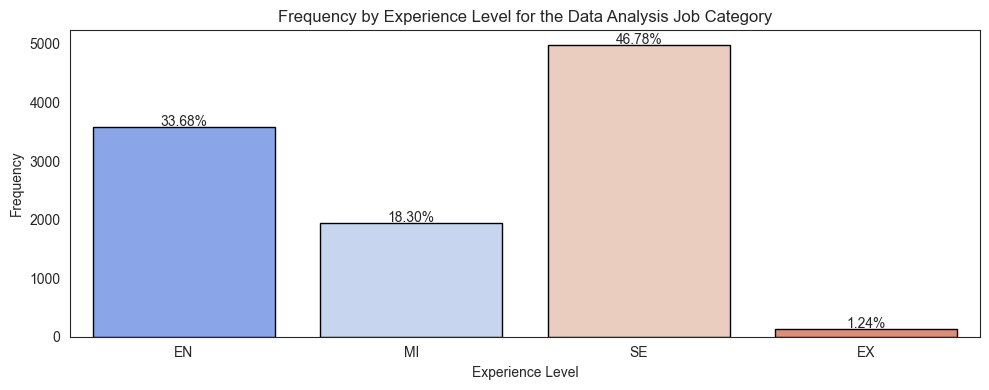

In [44]:
# Filter the DataFrame for the 'Data Analysis' job category
data_analyst = data_full_time_2025[data_full_time_2025['job_category'] == 'Data Analysis']

# Create a summary table
summary_table = data_analyst['experience_level'].value_counts().reset_index()
summary_table.columns = ['experience_level', 'frequency']

# Resize the plot
plt.figure(figsize=(10, 4))

# Create a bar chart using seaborn
sns.barplot(data=summary_table, x='experience_level', y='frequency', hue='experience_level', palette="coolwarm", edgecolor="black")

# Add percentage labels
total = float(len(data_analyst))
for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().text(p.get_x()+p.get_width()/2.,height + 10,'{:.2f}%'.format((height/total)*100),ha="center",fontsize=10)  # Adjust font size here

# Customize plot elements
plt.title('Frequency by Experience Level for the Data Analysis Job Category')
plt.xlabel('Experience Level')
plt.ylabel('Frequency')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.tight_layout()

# Show the plot
plt.show()

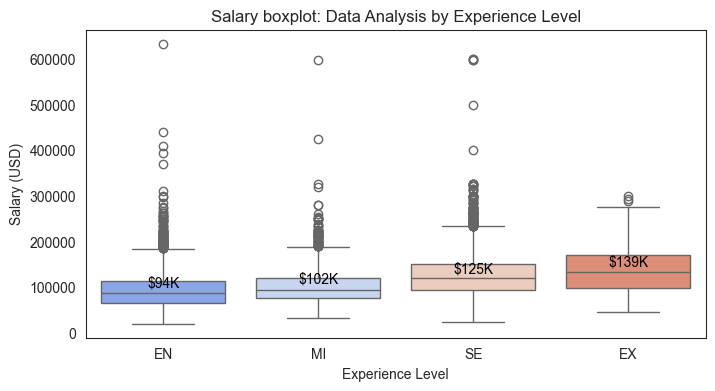

In [45]:
# Resize the plot
plt.figure(figsize=(8, 4))

# Create a violin plot using seaborn
sns.boxplot(data=data_analyst, x='experience_level', y='salary_in_usd', hue='experience_level', palette="coolwarm")

# Calculate the mean for each group
mean_values = data_analyst.groupby('experience_level', observed=True)['salary_in_usd'].mean()

# Format the mean values to display in K (thousands)
formatted_means = [f'${mean/1000:.0f}K' for mean in mean_values]

# Annotate the plot with formatted mean values
for i, level in enumerate(data_analyst['experience_level'].unique()):
    plt.text(i, mean_values[level], formatted_means[i], ha='center', va='bottom', color='black', fontsize=10)

# Customize plot elements
plt.title('Salary boxplot: Data Analysis by Experience Level')
plt.xlabel('Experience Level')
plt.ylabel('Salary (USD)')
plt.xticks(rotation=0)
plt.yticks(rotation=0)

# Save the plot to a file
#plt.savefig('/kaggle/working/analysis_experience.png')  # Saves the plot as a PNG file
# Show the plot
plt.show()

De acuerdo con el gráfico, como se esperaba que ocurriese, el salario aumenta de forma progresiva a medida que se avanza desde el nivel Entry-level hasta el nivel Senior.

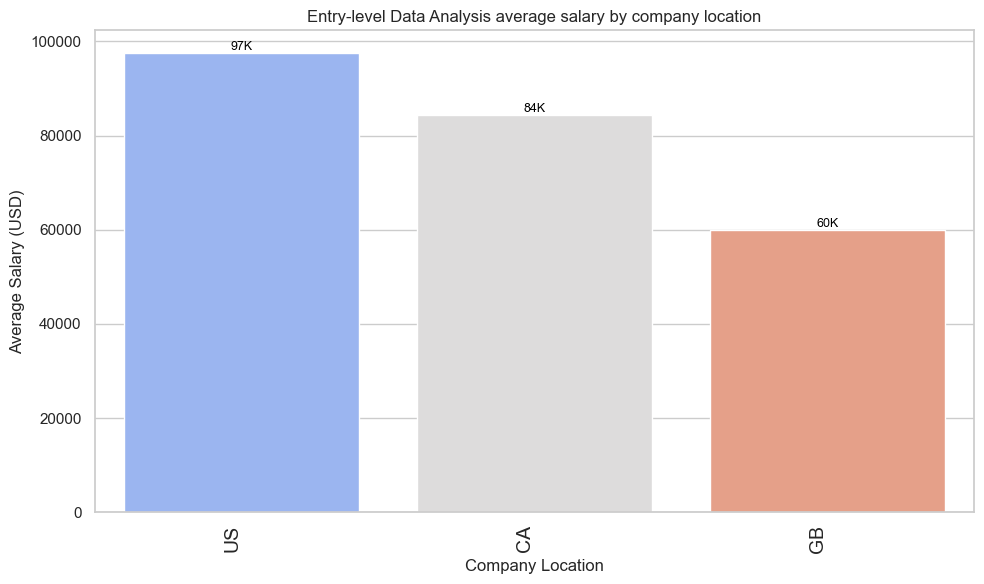

In [46]:
# Filtering the DataFrame for 'Data Analysis' category AND 'Entry-level' experience level
data_analyst_entry = data_analyst[data_analyst['experience_level'] == 'EN']

# Grouping by 'company_location' and calculating the average salary
summary_table = data_analyst_entry.groupby('company_location')['salary_in_usd'].mean().round().reset_index()

# Renaming the columns as per your R code
summary_table = summary_table.rename(columns={'salary_in_usd': 'avg_salary_entry_level'})

# Set Seaborn style
sns.set(style="whitegrid")

# Sort the summary_table by average salary in descending order
summary_table_sorted = summary_table.sort_values(by='avg_salary_entry_level', ascending=False)

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=summary_table_sorted, x='company_location', y='avg_salary_entry_level', hue='company_location', palette='coolwarm')

# Annotate each bar with the average salary in thousands (k)
for p in ax.patches:
    ax.annotate(f'{p.get_height() / 1000:.0f}K', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom', fontsize=9, color='black')

# Customize plot elements
plt.title('Entry-level Data Analysis average salary by company location')
plt.xlabel('Company Location')
plt.ylabel('Average Salary (USD)')
plt.xticks(rotation=90, ha='right', fontsize=14)

# Show the plot
plt.tight_layout()
# Save the plot to a file
#plt.savefig('/kaggle/working/company_location.png')  # Saves the plot as a PNG file
plt.show()

In [47]:
data_analyst_entry['company_location'].value_counts()

company_location
US    3089
GB     252
CA     245
Name: count, dtype: int64

A partir del gráfico obtenido, se puede observar que Estados Unidos ofrece salarios más altos que Canada y Gran Bretaña para un data analyst entry-level. Habría que tener en cuenta que para poder sacar mejores conclusiones se deberian obtener mayor cantidad de registros de Canada y Gran Bretaña.

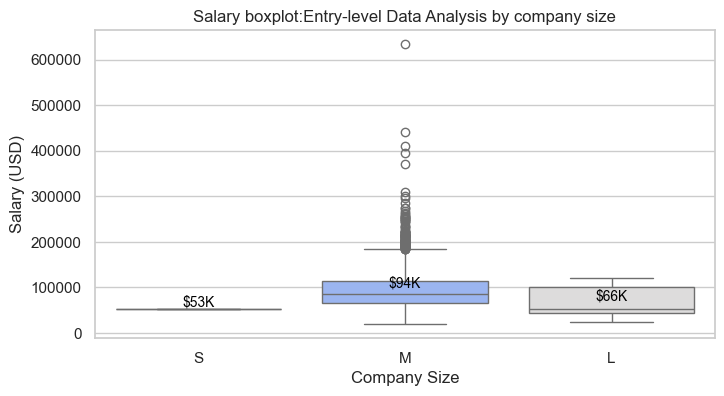

In [48]:
# Resize the plot
plt.figure(figsize=(8, 4))

# Define the desired order of 'company_size'
company_size_order = ["S", "M", "L"]

# Create a violin plot using seaborn with the specified order
sns.boxplot(data=data_analyst_entry, x='company_size', y='salary_in_usd', hue='company_size', order=company_size_order, palette="coolwarm")

# Calculate the mean for each group and sort according to the specified order
mean_values = data_analyst_entry.groupby('company_size')['salary_in_usd'].mean().loc[company_size_order]

# Format the mean values to display in K (thousands)
formatted_means = [f'${mean/1000:.0f}K' for mean in mean_values]

# Annotate the plot with formatted mean values
for i, size in enumerate(company_size_order):
    plt.text(i, mean_values[size], formatted_means[i], ha='center', va='bottom', color='black', fontsize=10)

# Customize plot elements
plt.title('Salary boxplot:Entry-level Data Analysis by company size')
plt.xlabel('Company Size')
plt.ylabel('Salary (USD)')
plt.xticks(rotation=0)
plt.yticks(rotation=0)

# Save the plot to a file
#plt.savefig('/kaggle/working/company_size.png')  # Saves the plot as a PNG file
# Show the plot
plt.show()

In [49]:
data_analyst_entry['company_size'].value_counts()

company_size
M    3569
L      15
S       2
Name: count, dtype: int64

Este boxplot es de poca utilidad ya que solo hay 2 datos de empresas pequeñas y 15 de empresas grandes. Por lo tanto el análisis se puede hacer unicamente en empresas medianas.

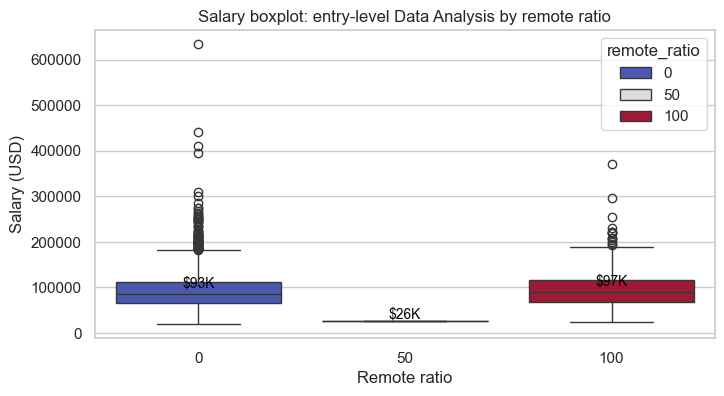

In [50]:
# Resize the plot
plt.figure(figsize=(8, 4))

# Define the desired order of 'work_setting'
remote_ratio_order = [0, 50, 100]

# Create a violin plot using seaborn with the specified order
sns.boxplot(data=data_analyst_entry, x='remote_ratio', y='salary_in_usd', hue='remote_ratio', order=remote_ratio_order, palette="coolwarm")

# Calculate the mean for each group and sort according to the specified order
mean_values = data_analyst_entry.groupby('remote_ratio')['salary_in_usd'].mean().loc[remote_ratio_order]

# Format the mean values to display in K (thousands)
formatted_means = [f'${mean/1000:.0f}K' for mean in mean_values]

# Annotate the plot with formatted mean values
for i, size in enumerate(remote_ratio_order):
    plt.text(i, mean_values[size], formatted_means[i], ha='center', va='bottom', color='black', fontsize=10)

# Customize plot elements
plt.title('Salary boxplot: entry-level Data Analysis by remote ratio')
plt.xlabel('Remote ratio')
plt.ylabel('Salary (USD)')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
# Save the plot to a file
#plt.savefig('/kaggle/working/work_setting.png')  # Saves the plot as a PNG file
# Show the plot
plt.show()

In [51]:
data_analyst_entry.remote_ratio.value_counts()

remote_ratio
0      3026
100     559
50        1
Name: count, dtype: int64

Dado que hay un solo registro para trabajo hibrido (remote_radio = 50%), esa opción queda fuera del análisis.
Se puede ver que aunque parece que no hay relación entre el modo de trabajo y el salario ya que la mediana de 100% remoto es algo mayor que la mediana del tipo de trabajo totalmente presencial. Sin embargo, se puede ver una gran cantidad de outliers para el trabajo 100% presencial. Esto se debe analizar si se deberian incluir dentro de la caja, lo que haría aumentar la mediana y daría el resultado esperado de mayor salario para el trabajo presencial.

Dado que la mayoría de los datos son de Estados Unidos, para eliminar las diferencias entre paises, se continuará el análisis unicamente para ofertas laborales de empresas ubicadas en este país.

In [52]:
data_df.work_year.value_counts()

work_year
2025    78726
2024    62241
Name: count, dtype: int64

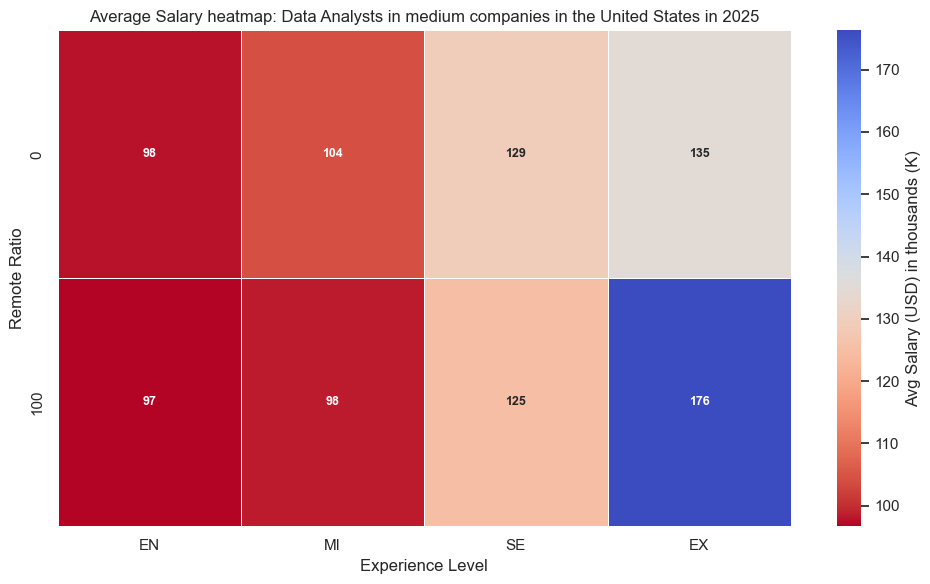

In [105]:
# Filtering the original data frame 'data_df' to select only
# United States, Data Analysis, Full-time, 2025, Size M and remote ratios 0 and 100
data_us = data_df[(data_df['company_location'] == 'US') & 
                  (data_df['job_category'] == 'Data Analysis') & 
                  (data_df['employment_type'] == 'FT') &
                  (data_df['work_year'] == 2025) &
                  (data_df['company_size'] == 'M') &
                  ((data_df['remote_ratio'] == 0) | (data_df['remote_ratio'] == 100))
                  ]

# Creating a summary table grouped by remote ratio, company size, and experience level
summary_table = data_us.groupby(['remote_ratio', 'experience_level'], observed=False)['salary_in_usd'] \
                       .mean().round().reset_index(name='average_salary')

# Convert the 'average_salary' to thousands (k) in the summary table
summary_table['average_salary'] = (summary_table['average_salary'] / 1000).round(1)

# Selecting only the desired columns
summary_table = summary_table[['remote_ratio', 'experience_level', 'average_salary']]

# Create a heatmap using seaborn
plt.figure(figsize=(10, 6))
heatmap_data = summary_table.pivot_table(index='remote_ratio', columns='experience_level', values='average_salary', observed=False)
sns.heatmap(data=heatmap_data, annot=True, fmt=".0f", linewidths=.5,  cmap="coolwarm_r", cbar_kws={'label': 'Avg Salary (USD) in thousands (K)'},
            annot_kws={'size': 9, 'fontweight': 'bold'})

# Customize plot elements
plt.title('Average Salary heatmap: Data Analysts in medium companies in the United States in 2025')
plt.xlabel('Experience Level')
plt.ylabel('Remote Ratio')
plt.xticks(rotation=0, ha='center')
caption_text = "Note: the average salary number displayed in the cells are in thousand (k)and in USD currency"

# Show the plot
plt.tight_layout()

# Save the plot to a file
#plt.savefig('/kaggle/working/united_states.png')  # Saves the plot as a PNG file
plt.show()

Con base en los resultados del mapa de calor (heatmap), se pueden realizar las siguientes observaciones:

En relación con los puestos de Data Analysis de nivel inicial (entry-level):

El salario promedio es independiente de la modalidad, ya que es casi el mismo para trabajo remoto y presencial.

En relación con los puestos de Data Analysis de nivel medio:

El salario promedio es mayor para la modalidad presencial y, en cambio, la modalidad 100% remoto tienen el mismo salario promedio que para entry level.

En relación con los puestos de Data Analysis de nivel Senior:

El salario promedio es independiente de la modalidad, siendo apenas superior la modalidad presencial.

Entre todos los niveles de experiencia, los Senior y Executive, tanto presencial como remotamente, presentan los salarios promedio más altos. Especificamente para el nivel de experiencia Executive, el salario promdio 100 % remoto es ampliamente superior al trabajo presencial. Se podría analizar si se debe a mayor cantidad de outliers.

En términos generales, el nivel de experiencia parece ser el factor con mayor influencia sobre el salario promedio, mucho más que si el trabajo es presencial o remoto, al menos para rangos de nivel inicial a senior.

Contrastes de hipotesis

En esta sección, se buscó aplicar pruebas estadísticas para evaluar si existen diferencias significativas en las distribuciones salariales entre tres categorías de empleo: “Data Engineering”, “Data Science and Research” y “Machine Learning and AI”.

Para garantizar una comparación justa, se filtraron los datos considerando únicamente los registros de empleo a tiempo completo (Full-time), nivel inicial (Entry-Level), empresas medianas (M), trabajos presenciales o 100% remotos y ubicados en Estados Unidos en el 2025.

El objetivo fue analizar cómo se comparan estos grupos en términos de sus estructuras salariales, lo cual resulta fundamental para tomar decisiones informadas.

In [54]:
filter_data = data_df[(data_df['experience_level'] == 'EN') &
                      (data_df['employment_type'] == 'FT') & 
                      (data_df['company_location'] == 'US') &
                      (data_df['company_size'] == 'M') &
                      (data_df['work_year'] == 2025) &
                      ((data_df['remote_ratio'] == 0) | (data_df['remote_ratio'] == 100))
                      ]

filter_data.shape

(5175, 12)

Metodología

Prueba de normalidad: Se comenzó analizando el supuesto de normalidad, el cual es esencial para seleccionar la prueba estadística adecuada al comparar medias o medianas entre grupos.

Para este propósito se empleó la prueba de Shapiro–Wilk, reconocida por su alta potencia para detectar desviaciones respecto de una distribución normal. Esta prueba se aplicó de manera independiente al conjunto de datos salariales de cada categoría de empleo.

In [55]:
import scipy.stats as stats

# Extracting salary data for each job category
data_engineering = filter_data[filter_data['job_category'] == 'Data Engineering']['salary_in_usd']
data_science = filter_data[filter_data['job_category'] == 'Data Science and Research']['salary_in_usd']
ml_ai = filter_data[filter_data['job_category'] == 'Machine Learning and AI']['salary_in_usd']

print(data_engineering.shape, data_science.shape, ml_ai.shape)

# Applying the Shapiro-Wilk Test
stat_de, p_de = stats.shapiro(data_engineering)
stat_ds, p_ds = stats.shapiro(data_science)
stat_mlai, p_mlai = stats.shapiro(ml_ai)

# Printing the results
print(f"Data Engineering Salaries: Statistics={stat_de:.3f}, p-value={p_de:.3f}")
print(f"Data Science and Research Salaries: Statistics={stat_ds:.3f}, p-value={p_ds:.3f}")
print(f"Machine Learning and AI Salaries: Statistics={stat_mlai:.3f}, p-value={p_mlai:.3f}")

# Checking the assumption of normality
def check_normality(p_value):
    if p_value > 0.05:
        return "Assumption of normality is met."
    else:
        return "Assumption of normality is not met."

print("Normality Check for Data Engineering Salaries:", check_normality(p_de))
print("Normality Check for Data Science and Research Salaries:", check_normality(p_ds))
print("Normality Check for Machine Learning and AI Salaries:", check_normality(p_mlai))

(712,) (496,) (140,)
Data Engineering Salaries: Statistics=0.912, p-value=0.000
Data Science and Research Salaries: Statistics=0.882, p-value=0.000
Machine Learning and AI Salaries: Statistics=0.941, p-value=0.000
Normality Check for Data Engineering Salaries: Assumption of normality is not met.
Normality Check for Data Science and Research Salaries: Assumption of normality is not met.
Normality Check for Machine Learning and AI Salaries: Assumption of normality is not met.


**Resultados de la prueba de Shapiro–Wilk:**
Los resultados de la prueba de Shapiro–Wilk indicaron que **ninguna de las categorías laborales sigue una distribución normal**, ya que los **valores p fueron significativamente bajos **. Este hallazgo sugiere que los datos salariales de las tres categorías presentan **desviaciones significativas respecto de la normalidad**.

**Selección de la prueba adecuada:**
Dada la **no normalidad de los datos**, se optó por aplicar la **prueba de Kruskal–Wallis** como siguiente paso. Esta decisión se basó en la necesidad de contar con una **alternativa no paramétrica al ANOVA**.

El ANOVA asume que los datos siguen una distribución normal y que las **varianzas entre grupos son iguales**, condiciones que no se cumplían en nuestro caso. En cambio, la **prueba de Kruskal–Wallis** no requiere el supuesto de normalidad y es adecuada para **comparar medianas entre tres o más grupos**. Es especialmente útil para determinar si existen **diferencias estadísticamente significativas entre las medianas de los grupos**, utilizando los **rangos de los valores** como base del análisis.


In [56]:
# Applying the Kruskal-Wallis Test
stat, p_value = stats.kruskal(data_engineering, data_science, ml_ai)

# Printing the result
print(f"Kruskal-Wallis Test Statistics: {stat:.3f}, p-value: {p_value:.10f}")

# Interpretation of the results
if p_value < 0.05:
    print("Reject the null hypothesis - There is a significant difference among the salary distributions of the three job categories.")
else:
    print("Fail to reject the null hypothesis - There is no significant difference among the salary distributions of the three job categories.")

Kruskal-Wallis Test Statistics: 38.825, p-value: 0.0000000037
Reject the null hypothesis - There is a significant difference among the salary distributions of the three job categories.


**Aplicación de la prueba de Kruskal–Wallis:**
Se aplicó la **prueba de Kruskal–Wallis** sobre los datos salariales de las tres categorías de empleo analizadas. El **p-value** resulto casi cero por lo que se decide **rechazar la hipótesis nula**.

Este resultado indica que **existen diferencias estadísticamente significativas en las distribuciones salariales** entre las tres categorías laborales evaluadas.


Conclusión

El resultado de la prueba de Kruskal–Wallis indica que las distribuciones salariales entre los puestos de nivel inicial en Data Engineering, Data Science and Research y Machine Learning and AI en Estados Unidos difieren de manera significativa. Este hallazgo sugiere que las estructuras salariales entre estas 3 categorias siguen patrones distintos.

Y España?

In [57]:
data_es = data_df[(data_df['company_location'] == 'ES')]

In [58]:
data_es.to_csv("data_es.csv", index=False)

In [59]:
data_es.work_year.value_counts()

work_year
2025    125
2024     64
Name: count, dtype: int64

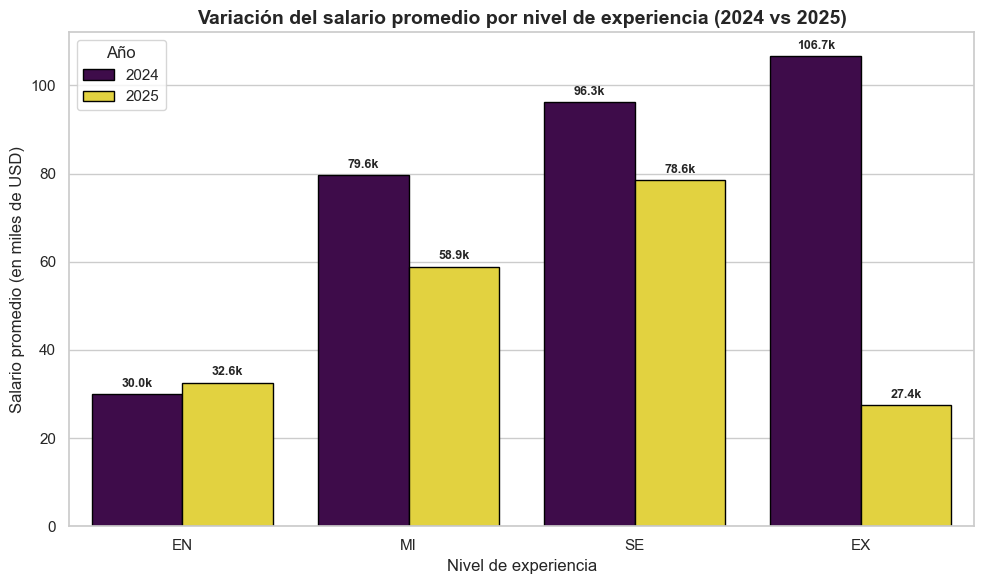

In [60]:
# Calcular salario promedio por año y nivel de experiencia
avg_salary_by_level = (
    data_es.groupby(["work_year", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# 4. Convertir a miles de USD
avg_salary_by_level["average_salary_k"] = (avg_salary_by_level["average_salary"] / 1000).round(1)

# 5. Crear el gráfico
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=avg_salary_by_level,
    x="experience_level",
    y="average_salary_k",
    hue="work_year",
    palette="viridis",
    edgecolor="black"
)

# 6. Agregar etiquetas (en miles)
for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f"{v.get_height():.1f}k" for v in container],
        label_type="edge",
        fontsize=9,
        fontweight="bold",
        padding=3
    )

# 7. Personalizar el gráfico
plt.title("Variación del salario promedio por nivel de experiencia (2024 vs 2025)", fontsize=14, fontweight="bold")
plt.xlabel("Nivel de experiencia", fontsize=12)
plt.ylabel("Salario promedio (en miles de USD)", fontsize=12)
plt.legend(title="Año", loc="upper left")
plt.tight_layout()

# 8. Mostrar
plt.show()


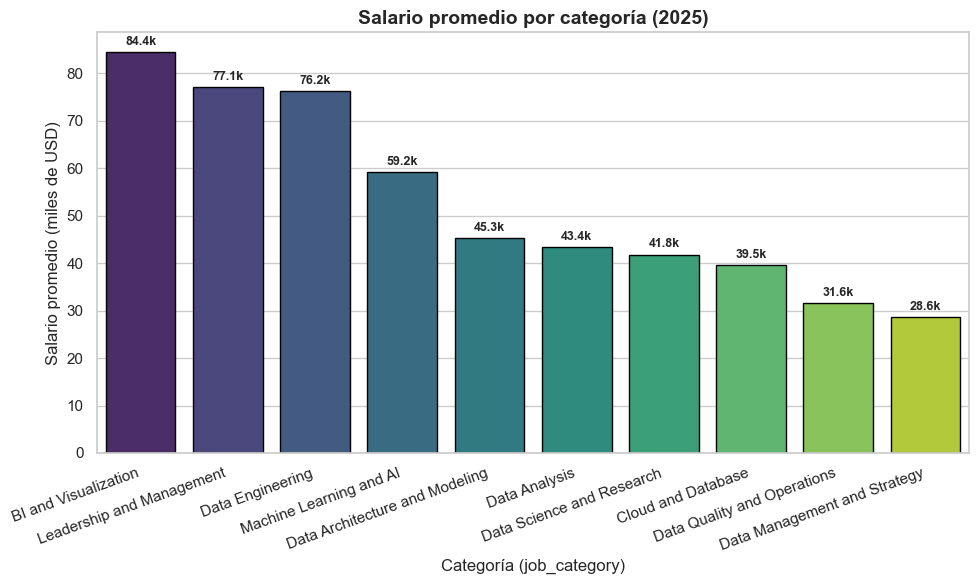

In [ ]:
# 1) Filtrar solo 2025
data_es_2025 = data_es[data_es["work_year"] == 2025].copy()

# 2) Promedio por categoría
avg_by_cat = (
    data_es_2025.groupby("job_category")["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# 3) A miles (k) y ordenar
avg_by_cat["average_salary_k"] = (avg_by_cat["average_salary"] / 1000).round(1)
avg_by_cat = avg_by_cat.sort_values("average_salary_k", ascending=False)

# 4) Gráfico
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=avg_by_cat,
    x="job_category",
    y="average_salary_k",
    hue="job_category",
    palette="viridis",
    edgecolor="black"
)

# 5) Etiquetas arriba de las barras en miles (k)
for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f"{v.get_height():.1f}k" for v in container],
        label_type="edge",
        fontsize=9,
        fontweight="bold",
        padding=3
    )

# 6) Estética
plt.title("Salario promedio por categoría (2025)", fontsize=14, fontweight="bold")
plt.xlabel("Categoría (job_category)", fontsize=12)
plt.ylabel("Salario promedio (miles de USD)", fontsize=12)
plt.xticks(rotation=20, ha="right")
plt.tight_layout()
plt.show()

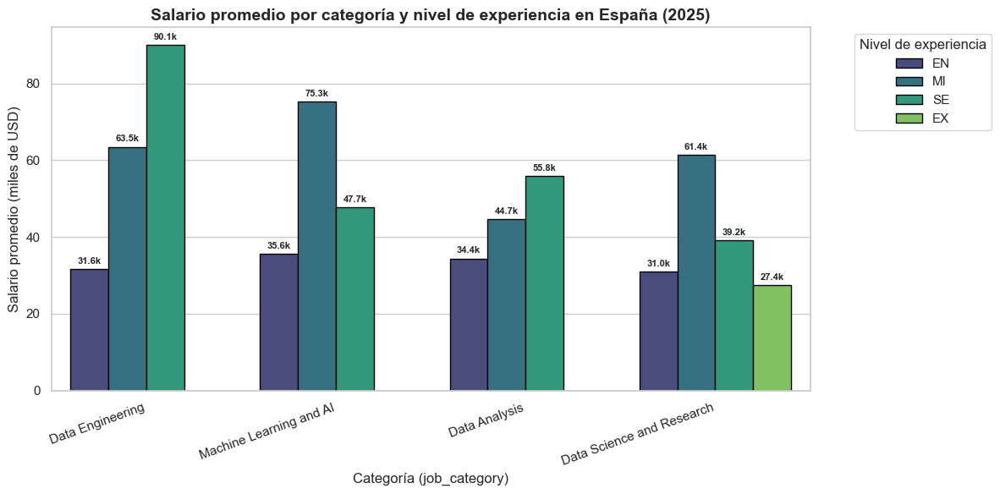

In [62]:
categorias_a_analizar = ['Data Engineering', 'Data Science and Research', 'Machine Learning and AI', 'Data Analysis']
data_es_2025 = data_es_2025[data_es_2025['job_category'].isin(categorias_a_analizar)]

# Calcular salario promedio por categoría y nivel de experiencia
avg_salary_cat_exp = (
    data_es_2025.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles de USD
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# Ordenar las categorías por salario promedio global (opcional, solo para estética)
order = (
    avg_salary_cat_exp.groupby("job_category")["average_salary_k"]
    .mean()
    .sort_values(ascending=False)
    .index
)

# 6) Crear el gráfico
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=avg_salary_cat_exp,
    x="job_category",
    y="average_salary_k",
    hue="experience_level",
    order=order,
    palette="viridis",
    edgecolor="black"
)

# Agregar etiquetas arriba de cada barra
for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f"{v.get_height():.1f}k" for v in container],
        label_type="edge",
        fontsize=8,
        fontweight="bold",
        padding=3
    )

# Personalización del gráfico
plt.title("Salario promedio por categoría y nivel de experiencia en España (2025)", fontsize=14, fontweight="bold")
plt.xlabel("Categoría (job_category)", fontsize=12)
plt.ylabel("Salario promedio (miles de USD)", fontsize=12)
plt.xticks(rotation=20, ha="right")
plt.legend(title="Nivel de experiencia", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrar
plt.show()


In [63]:
data_es.employment_type.value_counts()

employment_type
FT    189
Name: count, dtype: int64

In [64]:
data_es.remote_ratio.value_counts()

remote_ratio
100    94
0      91
50      4
Name: count, dtype: int64

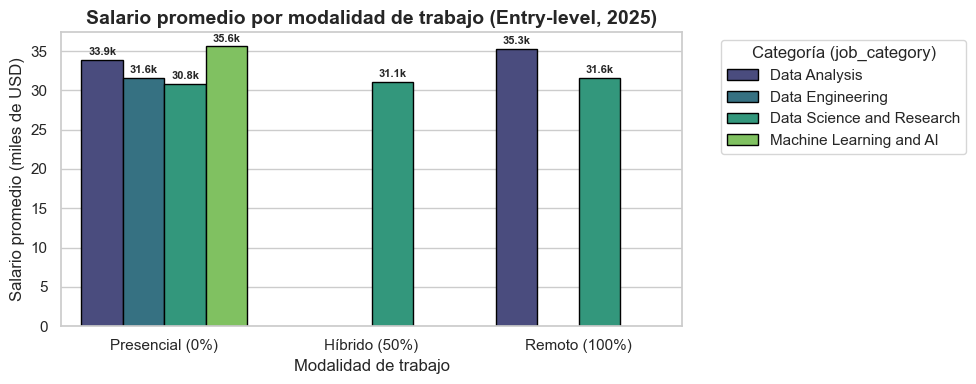

In [65]:
# Filtrar por nivel de experiencia Entry-level ("EN")
data_es_2025_en = data_es_2025[(data_es_2025["experience_level"] == "EN")].copy()

# 1. Mapeo de etiquetas y orden
label_map = {0: "Presencial (0%)", 50: "Híbrido (50%)", 100: "Remoto (100%)"}
order_labels = ["Presencial (0%)", "Híbrido (50%)", "Remoto (100%)"]

# 2. Agrupar
avg_salary_remote = (
    data_es_2025_en.groupby(["remote_ratio", "job_category"])["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# 3. Convertir a miles (k)
avg_salary_remote["average_salary_k"] = (avg_salary_remote["average_salary"] / 1000).round(1)

# 4. Crear columna categórica ordenada
avg_salary_remote["remote_label"] = pd.Categorical(
    avg_salary_remote["remote_ratio"].map(label_map),
    categories=order_labels,
    ordered=True
)

# 5. Graficar
plt.figure(figsize=(10, 4))
ax = sns.barplot(
    data=avg_salary_remote,
    x="remote_label",
    y="average_salary_k",
    hue="job_category",
    palette="viridis",
    edgecolor="black"
)

# 6. Etiquetas sobre las barras
for cont in ax.containers:
    ax.bar_label(
        cont,
        labels=[f"{b.get_height():.1f}k" if np.isfinite(b.get_height()) and b.get_height() > 0 else "" for b in cont],
        label_type="edge",
        fontsize=8,
        fontweight="bold",
        padding=2
    )

# 7. Personalización
plt.title("Salario promedio por modalidad de trabajo (Entry-level, 2025)", fontsize=14, fontweight="bold")
plt.xlabel("Modalidad de trabajo", fontsize=12)
plt.ylabel("Salario promedio (miles de USD)", fontsize=12)
plt.legend(title="Categoría (job_category)", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [66]:
data_es.work_year.value_counts()

work_year
2025    125
2024     64
Name: count, dtype: int64

In [67]:
data_es[data_es['work_year']==2025].job_title.value_counts().head()

job_title
Software Engineer    20
Data Scientist       16
Data Engineer        12
Data Analyst         12
AI Engineer           9
Name: count, dtype: int64

In [68]:
data_es.employment_type.value_counts()

employment_type
FT    189
Name: count, dtype: int64

Test de Hipotesis

Chi Cuadrado

Quiero usar chi cuadrado para confirmar que haya una relacion estadisticamente significativa entre experience_level y salary_in_usd. Para eso voy a transformar salary_in_usd en una variable categórica:

In [69]:
bins = [0, 100000, 150000, 200000, 300000, 400000, 600000, data_df["salary_in_usd"].max()]
labels = ["<100k", "100-150k", "150-200k", "200-300k", "300-400k", "400-600k", ">600k"]

data_df["salary_level"] = pd.cut(data_df["salary_in_usd"], bins=bins, labels=labels, include_lowest=True)

In [70]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(data_df["experience_level"], data_df["salary_level"])

# Aplicar Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

print("Chi² =", chi2)
print("p-value =", p)
print("Grados de libertad =", dof)

if p < 0.05:
    print("→ Existe una asociación significativa entre nivel de experiencia y nivel salarial.")
else:
    print("→ No se encontró asociación significativa entre nivel de experiencia y nivel salarial.")


Chi² = 21455.687950024967
p-value = 0.0
Grados de libertad = 18
→ Existe una asociación significativa entre nivel de experiencia y nivel salarial.


Y si ahora quiero ver si hay una relación estadisticamente significativa entre la categoria del empleo y el salario:

In [71]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(data_df["job_category"], data_df["salary_level"])

# Aplicar Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

print("Chi² =", chi2)
print("p-value =", p)
print("Grados de libertad =", dof)

if p < 0.05:
    print("→ Existe una asociación significativa entre categoria de empleo y nivel salarial.")
else:
    print("→ No se encontró asociación significativa entre categoria de empleo y nivel salarial.")

Chi² = 20414.32304694531
p-value = 0.0
Grados de libertad = 66
→ Existe una asociación significativa entre categoria de empleo y nivel salarial.


Lo voy a acotar para Entry Level

In [72]:
df_en = data_df[data_df["experience_level"] == "EN"]

# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(df_en["job_category"], df_en["salary_level"])

# Aplicar Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

print("Chi² =", chi2)
print("p-value =", p)
print("Grados de libertad =", dof)

if p < 0.05:
    print("→ Existe una asociación significativa entre categoria de empleo y nivel salarial para Entry Level.")
else:
    print("→ No se encontró asociación significativa entre categoria de empleo y nivel salarial para Entry Level.")

Chi² = 1529.1246225836824
p-value = 6.64339733594339e-276
Grados de libertad = 66
→ Existe una asociación significativa entre categoria de empleo y nivel salarial para Entry Level.


Y si hago lo mismo para el rol (job_title:)

In [73]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(data_df["job_title"], data_df["salary_level"])

# Aplicar Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

print("Chi² =", chi2)
print("p-value =", p)
print("Grados de libertad =", dof)

if p < 0.05:
    print("→ Existe una asociación significativa entre categoria de empleo y nivel salarial.")
else:
    print("→ No se encontró asociación significativa entre categoria de empleo y nivel salarial.")

Chi² = 39869.44061589159
p-value = 0.0
Grados de libertad = 2298
→ Existe una asociación significativa entre categoria de empleo y nivel salarial.


In [74]:
df_en = data_df[data_df["experience_level"] == "EN"]

# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(df_en["job_title"], df_en["salary_level"])

# Aplicar Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

print("Chi² =", chi2)
print("p-value =", p)
print("Grados de libertad =", dof)

if p < 0.05:
    print("→ Existe una asociación significativa entre categoria de empleo y nivel salarial para Entry Level.")
else:
    print("→ No se encontró asociación significativa entre categoria de empleo y nivel salarial para Entry Level.")

Chi² = 5163.545676258105
p-value = 0.0
Grados de libertad = 1038
→ Existe una asociación significativa entre categoria de empleo y nivel salarial para Entry Level.


Mann Whitney

Podemos usar el test de Mann Whitney para ver si hay una relacion estadisticamente significativa entre remote_ratio (categórica) y salary_in_usd (numerica). Para poder usar Mann Whitney debemos transformar a la variable remote_ratio en una variable binaria. Para esto, necesito filtrar los registros que tienen de valor 50, ya que al ser tan poco no son estadisticamente relevantes. Luego los que tienen de valor 100 toman el valor 'remoto' y los de valor 0, 'presencial'.

In [75]:
data_df.remote_ratio.value_counts()

remote_ratio
0      113038
100     27833
50         96
Name: count, dtype: int64

Como vemos la variable remote_ratio tiene muy pocos valores de 50%, la convertimos entonces en binaria tomando 0-> Presencia, 100-> Remoto

In [76]:
# Eliminar los registros de remote_ratio = 50
data_mw = data_df[data_df["remote_ratio"] != 50].copy()

In [77]:
data_mw.remote_ratio.value_counts()

remote_ratio
0      113038
100     27833
Name: count, dtype: int64

In [78]:
# Crear la variable binaria 'work_setting'
data_mw["work_setting"] = data_mw["remote_ratio"].map({0: "presencial", 100: "remoto"})

In [79]:
# Mann-Whitney U-test
# 1 Separar los datos en dos grupos según los valores de la variable categórica
group_remote = data_mw[data_mw["work_setting"] == "remoto"]["salary_in_usd"]
group_presencial = data_mw[data_mw["work_setting"] == "presencial"]["salary_in_usd"]

# 2 Aplicar la prueba y mostrar los resultados
u_stat, p_valor = mannwhitneyu(group_remote, group_presencial, alternative='two-sided')

print(f"Estadístico U = {u_stat:.3f}")
print(f"p-valor = {p_valor}")

if p < 0.05:
    print("→ Hay una diferencia estadísticamente significativa entre los salarios de trabajo remoto y presencial.")
else:
    print("→ No se encontraron diferencias significativas entre los salarios de trabajo remoto y presencial.")

Estadístico U = 1506560929.000
p-valor = 6.808841186411105e-28
→ Hay una diferencia estadísticamente significativa entre los salarios de trabajo remoto y presencial.


In [80]:
n1, n2 = len(group_remote), len(group_presencial)
z = (u_stat - (n1 * n2 / 2)) / np.sqrt(n1 * n2 * (n1 + n2 + 1) / 12)
r = abs(z) / np.sqrt(n1 + n2)

print(f"Tamaño del efecto r = {r:.3f}", end=' ')
if r < 0.1:
    print("→ despreciable")
elif 0.1 < r < 0.3:
    print("→ pequeño")
elif 0.3 < r < 0.5:
    print("→ mediano")
else:
    print("→ grande")

Tamaño del efecto r = 0.029 → despreciable


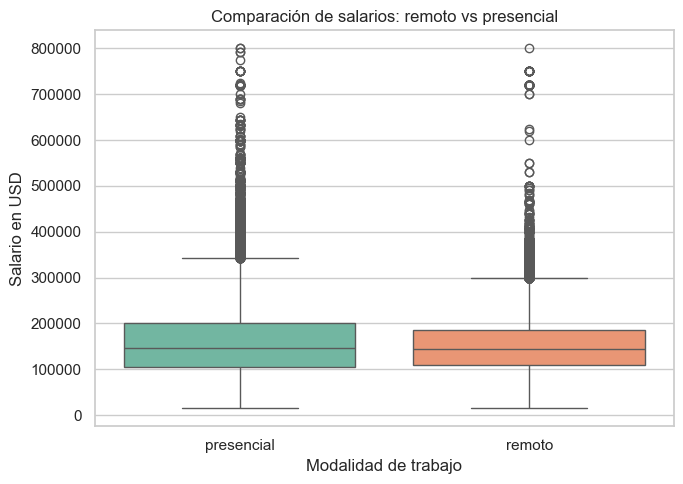

In [81]:
plt.figure(figsize=(7, 5))
sns.boxplot(data=data_mw, x="work_setting", y="salary_in_usd", hue='work_setting', palette="Set2")
plt.title("Comparación de salarios: remoto vs presencial")
plt.xlabel("Modalidad de trabajo")
plt.ylabel("Salario en USD")
plt.tight_layout()
plt.show()


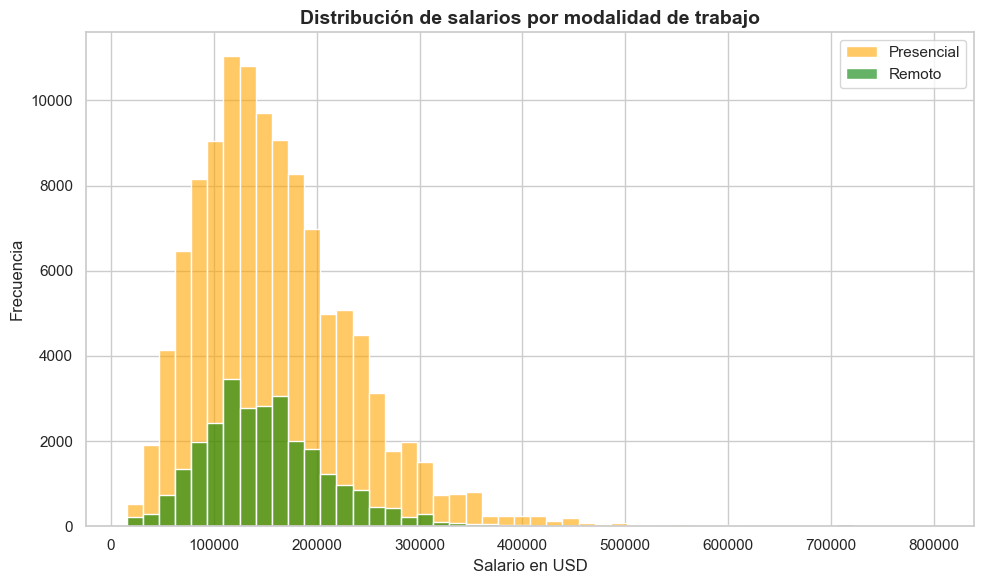

In [82]:
plt.figure(figsize=(10, 6))

sns.histplot(group_presencial, color="orange", label="Presencial", kde=False, bins=50, alpha=0.6)
sns.histplot(group_remote, color="green", label="Remoto", kde=False, bins=50, alpha=0.6)

plt.title("Distribución de salarios por modalidad de trabajo", fontsize=14, fontweight="bold")
plt.xlabel("Salario en USD", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


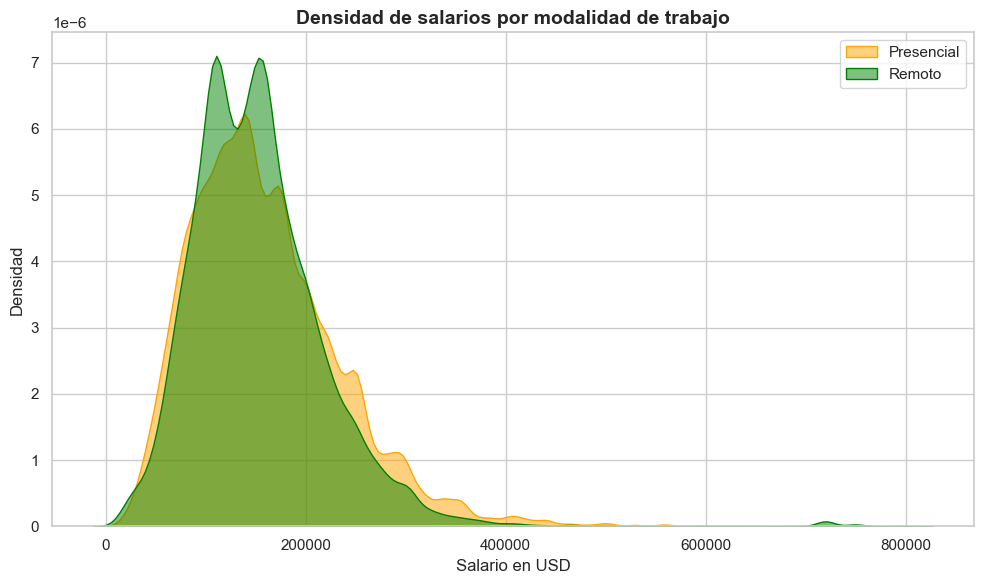

In [83]:
plt.figure(figsize=(10, 6))

sns.kdeplot(group_presencial, fill=True, color="orange", label="Presencial", alpha=0.5)
sns.kdeplot(group_remote, fill=True, color="green", label="Remoto", alpha=0.5)

plt.title("Densidad de salarios por modalidad de trabajo", fontsize=14, fontweight="bold")
plt.xlabel("Salario en USD", fontsize=12)
plt.ylabel("Densidad", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


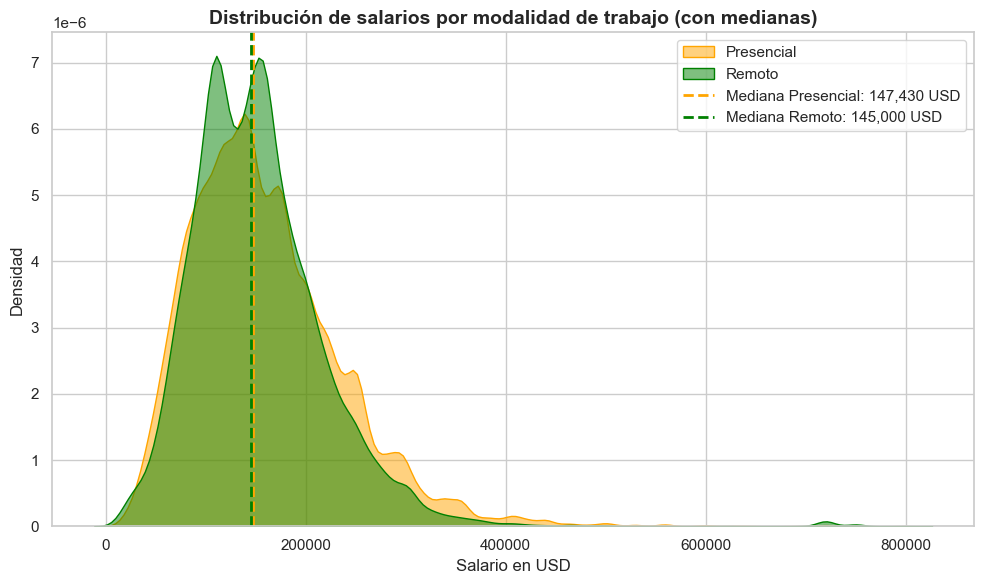

In [84]:
# Calcular las medianas de cada grupo
median_presencial = group_presencial.median()
median_remoto = group_remote.median()

# Crear el gráfico
plt.figure(figsize=(10, 6))

# KDEs
sns.kdeplot(group_presencial, fill=True, color="orange", label="Presencial", alpha=0.5)
sns.kdeplot(group_remote, fill=True, color="green", label="Remoto", alpha=0.5)

# Líneas de mediana
plt.axvline(median_presencial, color="orange", linestyle="--", linewidth=2, label=f"Mediana Presencial: {median_presencial:,.0f} USD")
plt.axvline(median_remoto, color="green", linestyle="--", linewidth=2, label=f"Mediana Remoto: {median_remoto:,.0f} USD")

# Título y etiquetas
plt.title("Distribución de salarios por modalidad de trabajo (con medianas)", fontsize=14, fontweight="bold")
plt.xlabel("Salario en USD", fontsize=12)
plt.ylabel("Densidad", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


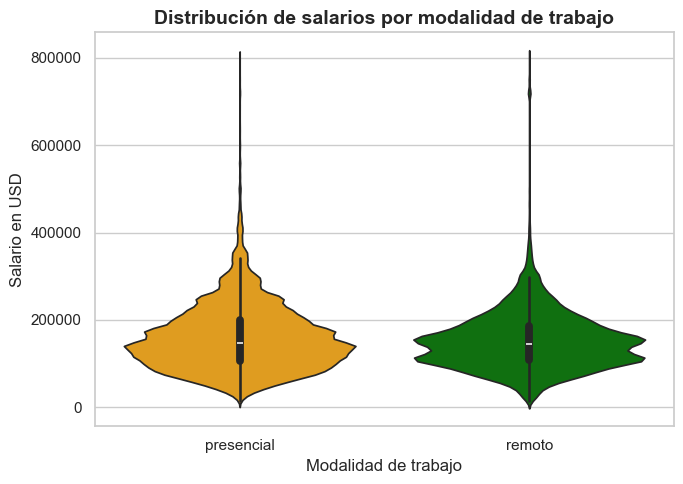

In [85]:
plt.figure(figsize=(7, 5))
sns.violinplot(data=data_mw, x="work_setting", y="salary_in_usd", hue='work_setting', palette=["orange", "green"], inner="box")
plt.title("Distribución de salarios por modalidad de trabajo", fontsize=14, fontweight="bold")
plt.xlabel("Modalidad de trabajo")
plt.ylabel("Salario en USD")
plt.tight_layout()
plt.show()

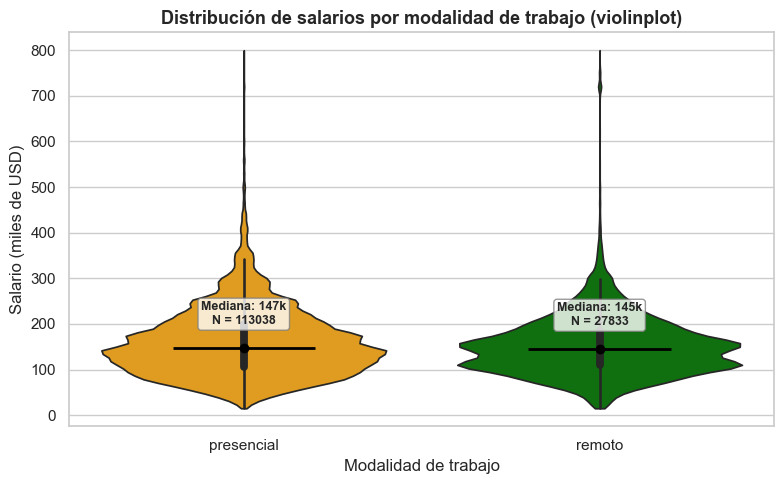

In [86]:
# --- Configuración ---
USE_THOUSANDS = True   # True -> muestra salarios en miles (k)
USE_LOGSCALE  = False  # True -> eje Y en log10 para outliers

df = data_mw.copy()  # debe tener 'work_setting' ∈ {'presencial','remoto'} y 'salary_in_usd'

# 1) Preparar valores
ycol = "salary_in_usd"
plot_y = df[ycol] / 1000 if USE_THOUSANDS else df[ycol]
ylabel = "Salario (miles de USD)" if USE_THOUSANDS else "Salario en USD"

df_plot = df.assign(_salary_plot=plot_y)

# 2) Estadísticos por grupo
stats = (
    df_plot.groupby("work_setting")["_salary_plot"]
    .agg(median="median", n="count")
    .reset_index()
)

# 3) Violinplot + caja interna para mediana/IQR
plt.figure(figsize=(8, 5))
ax = sns.violinplot(
    data=df_plot, x="work_setting", y="_salary_plot", hue='work_setting',
    palette=["orange", "green"], inner="box", cut=0
)

# 4) Marcar la mediana con un punto y una línea
for i, row in stats.iterrows():
    ax.plot(i, row["median"], marker="o", color="black", ms=6, zorder=5)
    # Línea horizontal sobre la mediana (opcional)
    ax.hlines(row["median"], i-0.2, i+0.2, colors="black", linewidth=2, zorder=4)

# 5) Anotar valores (mediana y n) sobre cada violín
for i, row in stats.iterrows():
    ax.annotate(
        f"Mediana: {row['median']:.0f}{'k' if USE_THOUSANDS else ''}\nN = {row['n']}",
        xy=(i, row["median"]),
        xytext=(0, 15),
        textcoords="offset points",
        ha="center", va="bottom",
        fontsize=9, fontweight="bold",
        bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="gray", alpha=0.8)
    )

# 6) Opcionales: escala log y/o límites
if USE_LOGSCALE:
    ax.set_yscale("log")
    ylabel += " (log10)"

# 7) Estética
plt.title("Distribución de salarios por modalidad de trabajo (violinplot)", fontsize=13, fontweight="bold")
plt.xlabel("Modalidad de trabajo")
plt.ylabel(ylabel)
plt.tight_layout()
plt.show()


Ahora quiero analizar si hay independencia entre 2 variables categóricas (experience_level,y work_setting) y una númerica (salary_in_usd)

In [87]:
def plot_grouped_histograms(df, cat_col, num_col, group_size):
    unique_cats = df[cat_col].unique()
    num_cats = len(unique_cats)

    for i in range(0, num_cats, group_size):
        subset_cats = unique_cats[i:i+group_size]
        subset_df = df[df[cat_col].isin(subset_cats)]
        
        plt.figure(figsize=(10, 6))
        for cat in subset_cats:
            sns.histplot(subset_df[subset_df[cat_col] == cat][num_col], kde=True, label=str(cat))
        
        plt.title(f'Histograms of {num_col} for {cat_col} (Group {i//group_size + 1})')
        plt.xlabel(num_col)
        plt.ylabel('Frequency')
        plt.legend()
        plt.show()


In [88]:
def trivariant_analysis(df, directora, cat2, num1, group_size = 3, bins = "auto"):
    col_directora = directora
    col_1 = cat2
    col_2 = num1
    diccionario_multivariante = {}
    for valor in df[col_directora].unique():
        diccionario_multivariante[valor] = df.loc[df[col_directora] == valor,[col_2,col_1]] 

    for valor,df_datos in diccionario_multivariante.items():
        print(f"Respuesta {valor}:")
        plot_grouped_histograms(df_datos,col_1,col_2, group_size= group_size)


Respuesta presencial:


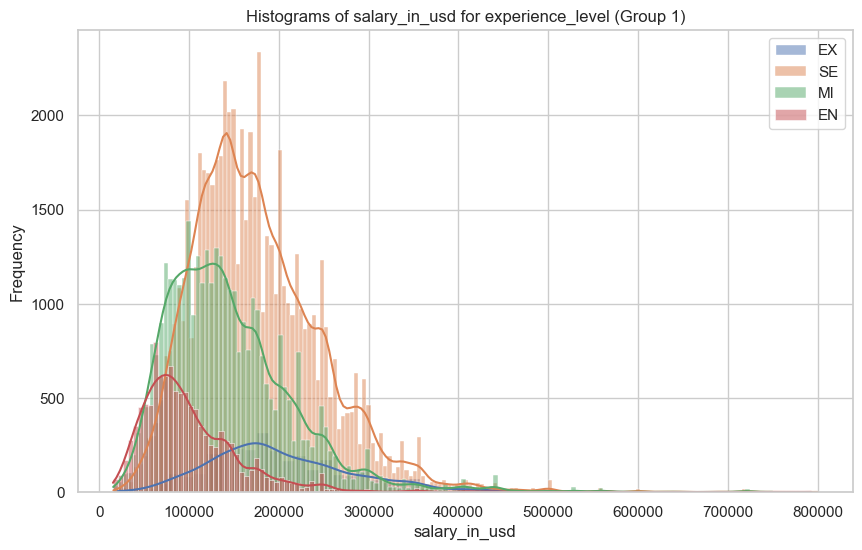

Respuesta remoto:


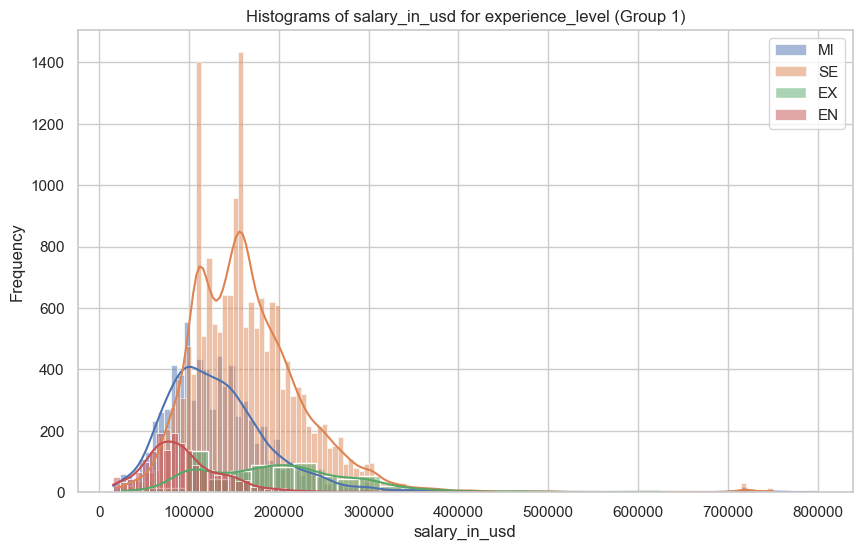

In [89]:
trivariant_analysis(data_mw, "work_setting", "experience_level", "salary_in_usd", group_size=4, bins=30)

Respuesta EX:


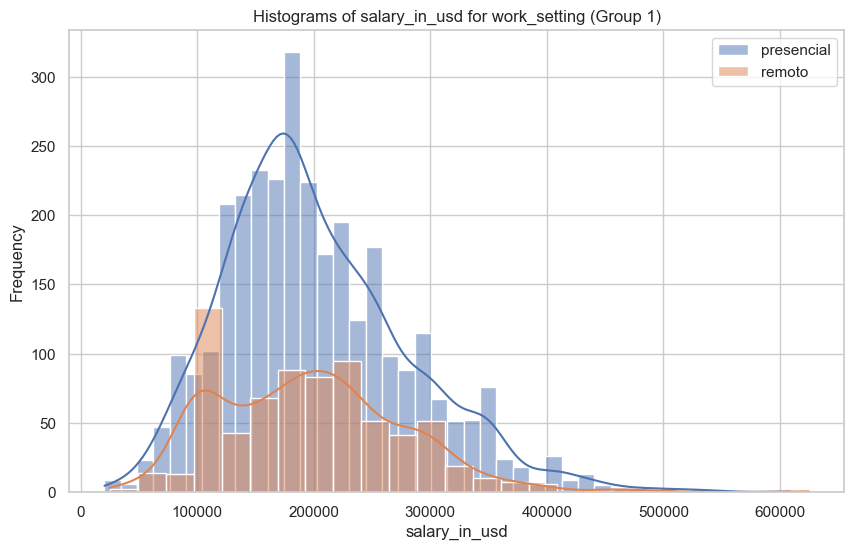

Respuesta SE:


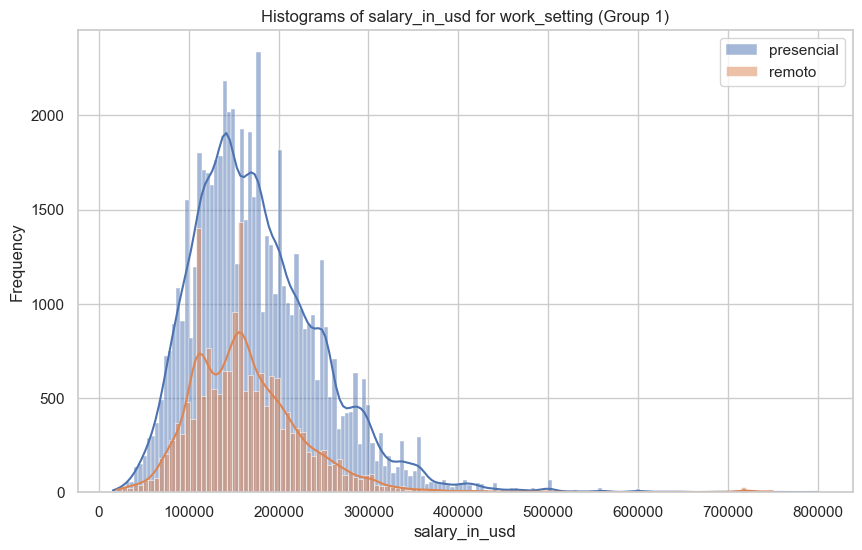

Respuesta MI:


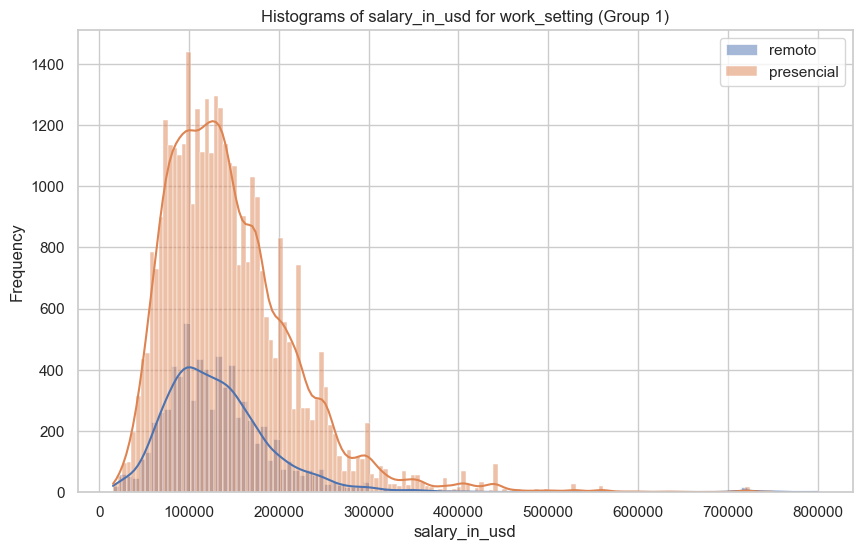

Respuesta EN:


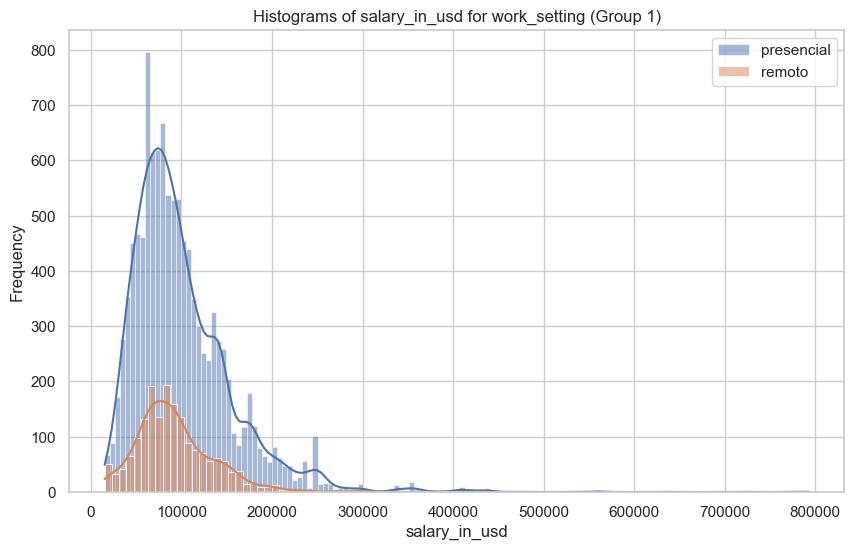

In [90]:
trivariant_analysis(data_mw, "experience_level", "work_setting", "salary_in_usd", group_size=4, bins=30)

Y si quiero analizar si hay una relacion entre job_category, experience_level y salary_in_usd:

Respuesta Leadership and Management:


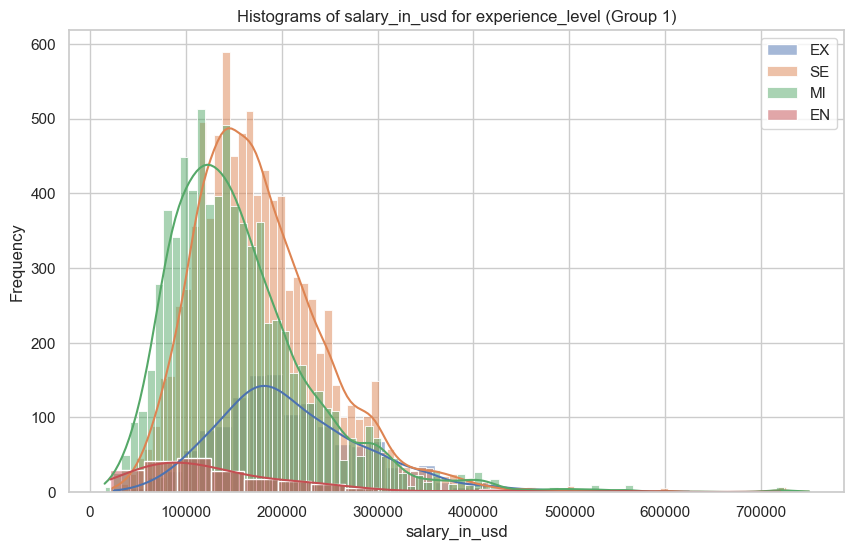

Respuesta Data Science and Research:


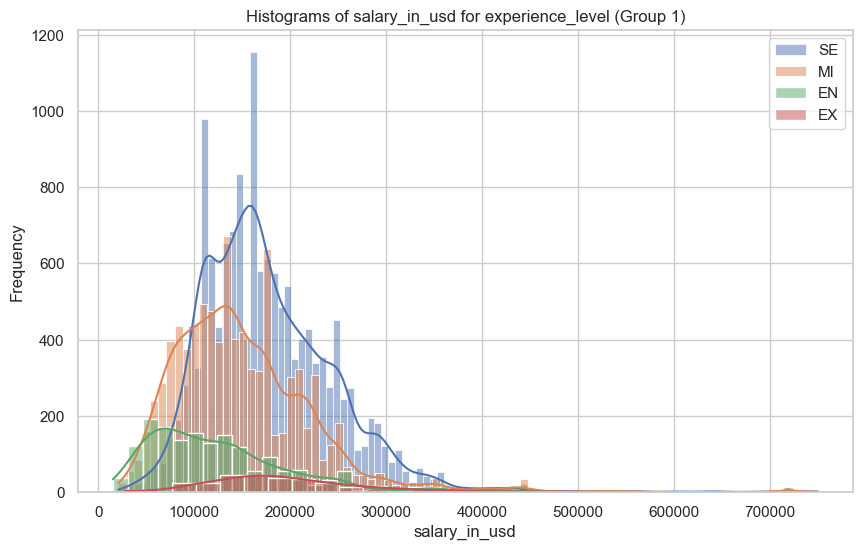

Respuesta Data Engineering:


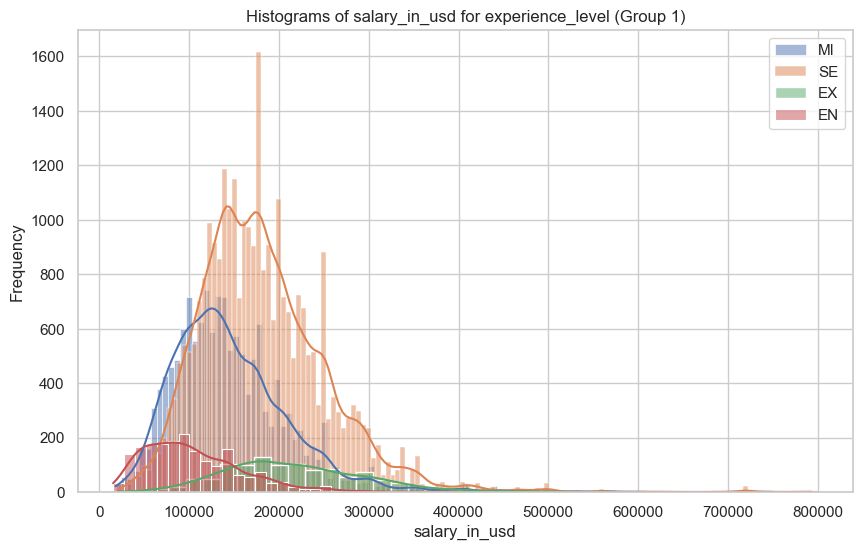

Respuesta Machine Learning and AI:


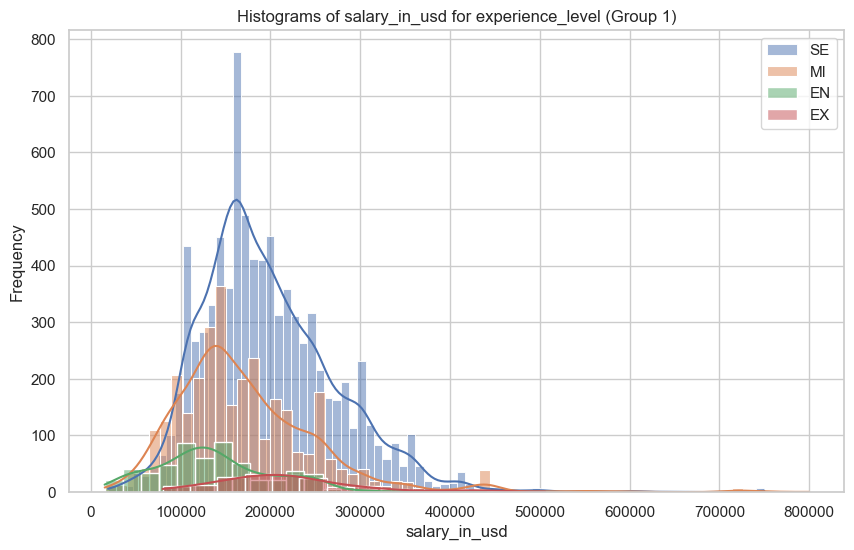

Respuesta BI and Visualization:


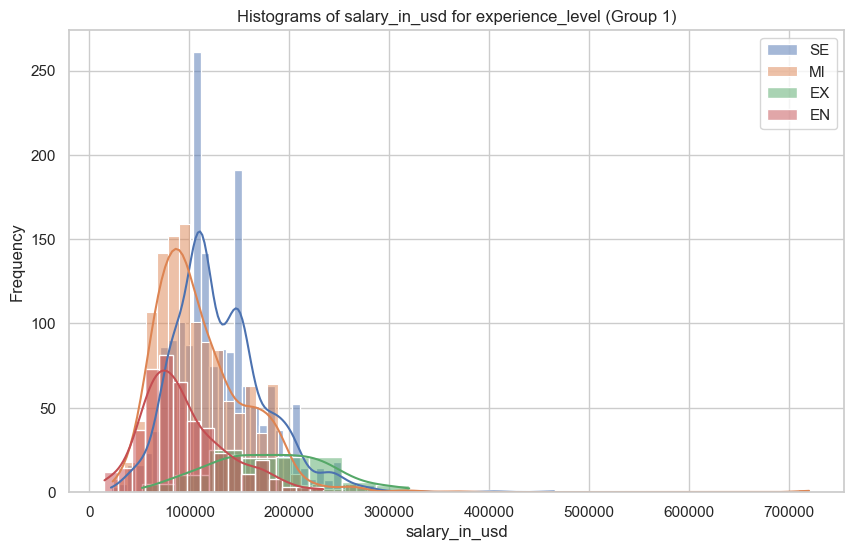

Respuesta Data Management and Strategy:


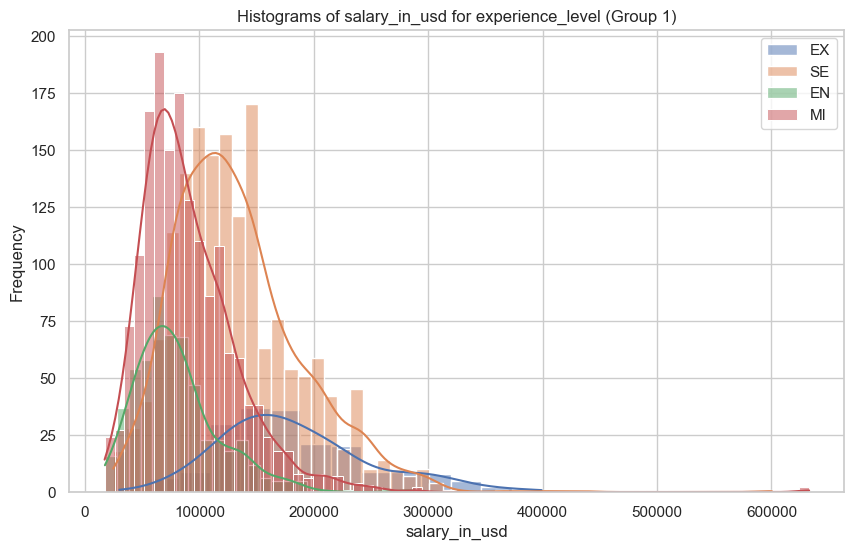

Respuesta Data Analysis:


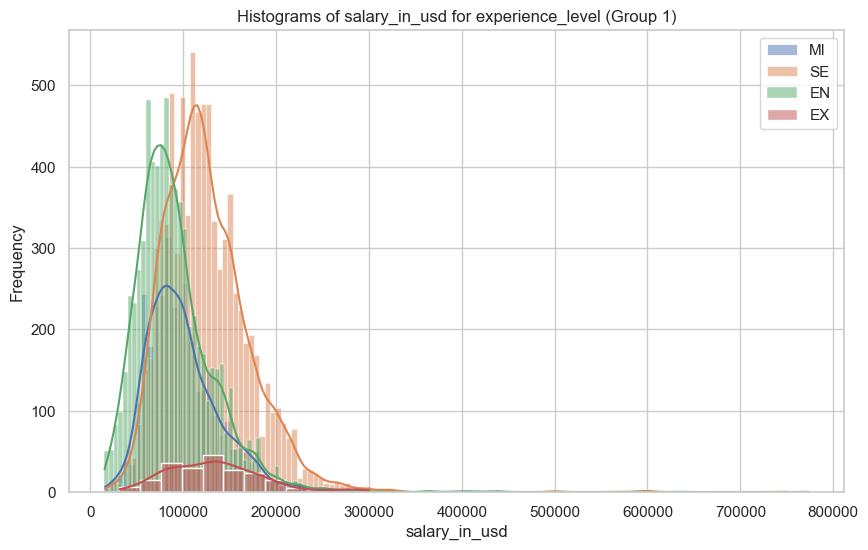

Respuesta General, Administrative & Training:


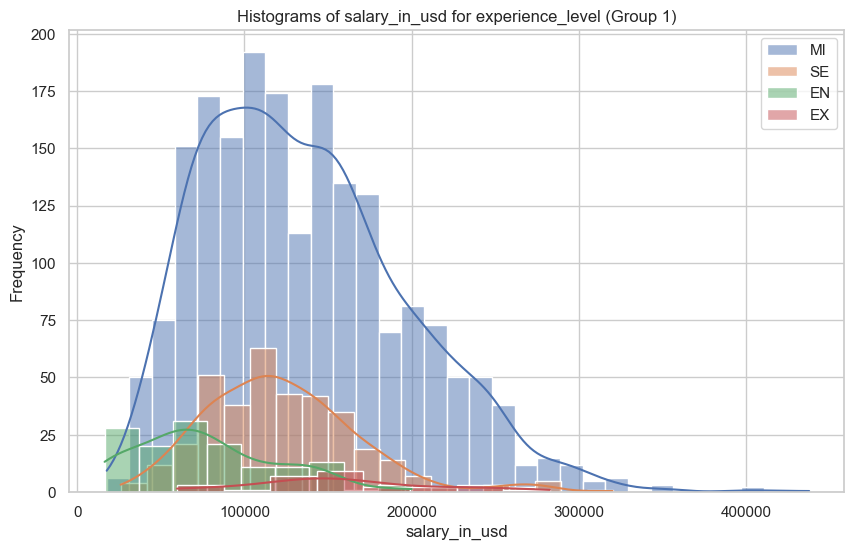

Respuesta Data Quality and Operations:


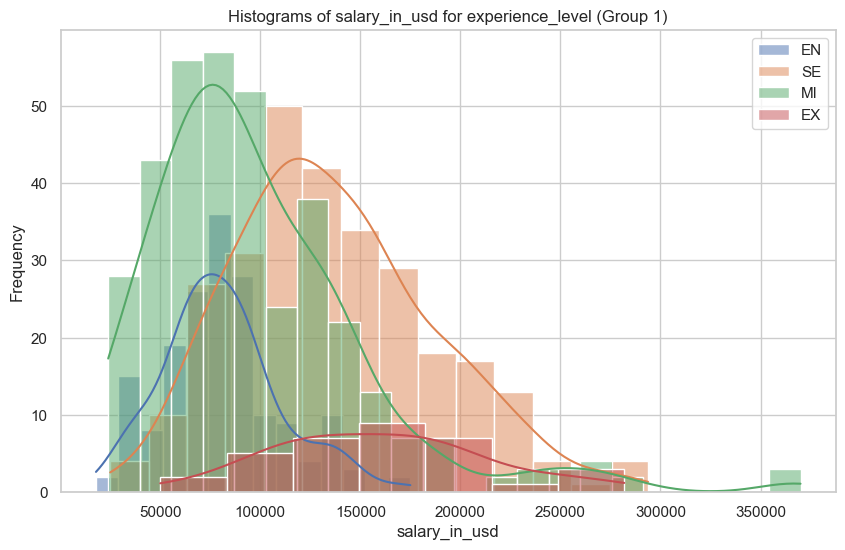

Respuesta Cloud and Database:


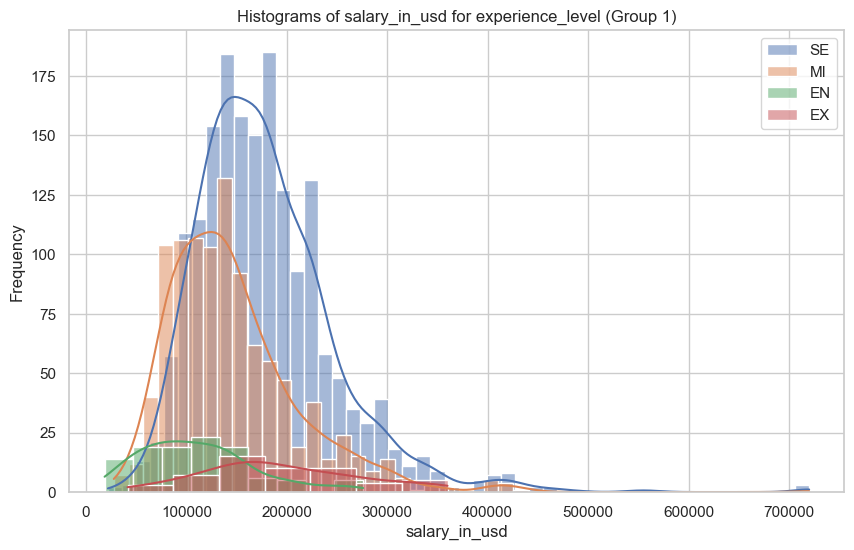

Respuesta Data Architecture and Modeling:


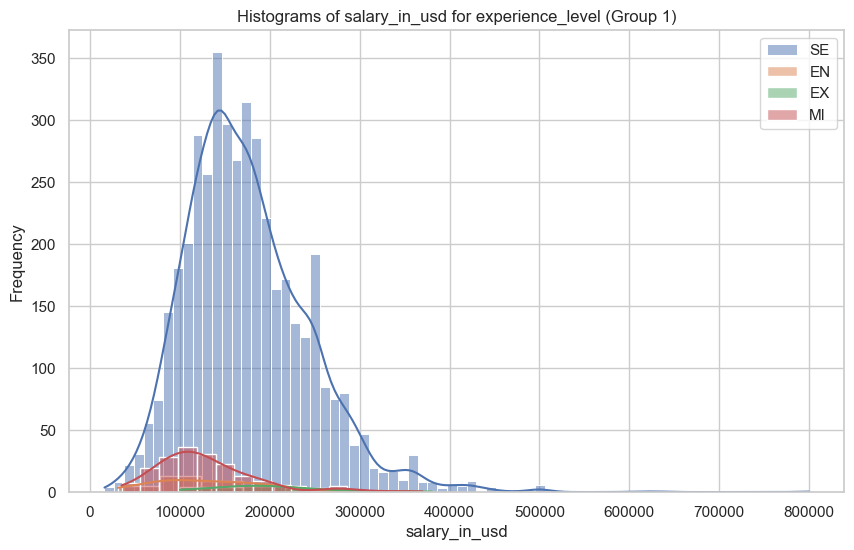

Respuesta Business, Sales & Marketing:


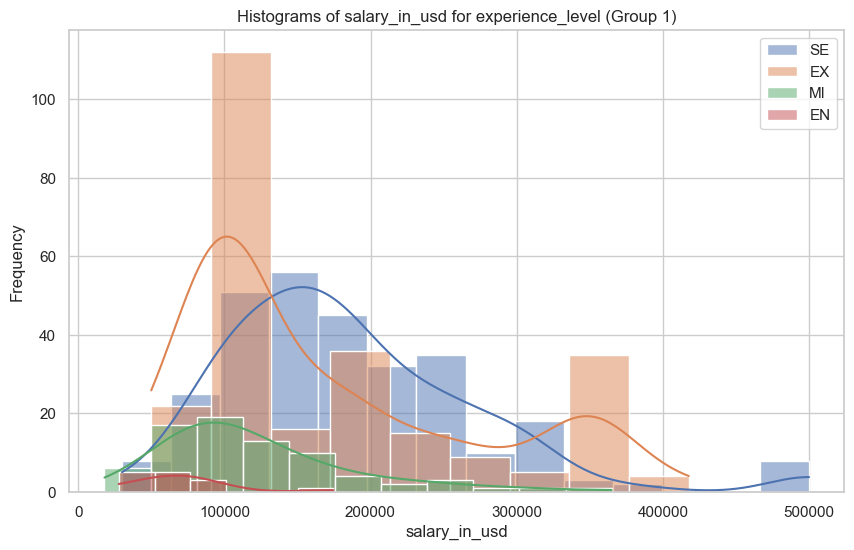

In [91]:
trivariant_analysis(data_df, "job_category", "experience_level", "salary_in_usd", group_size=4, bins=30)

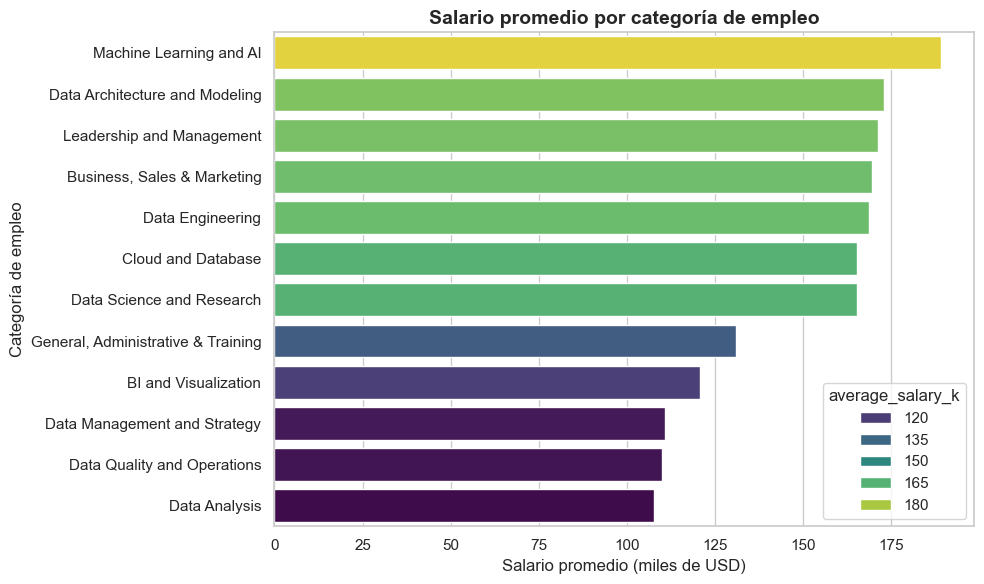

In [92]:
# Promedio general por categoría
avg_salary_cat = (
    data_df.groupby("job_category")["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
    .sort_values("average_salary", ascending=False)
)

# Convertir a miles (k)
avg_salary_cat["average_salary_k"] = (avg_salary_cat["average_salary"] / 1000).round(1)

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_salary_cat, x="average_salary_k", y="job_category", hue='average_salary_k', palette="viridis")

plt.title("Salario promedio por categoría de empleo", fontsize=14, fontweight="bold")
plt.xlabel("Salario promedio (miles de USD)")
plt.ylabel("Categoría de empleo")
plt.tight_layout()
plt.show()


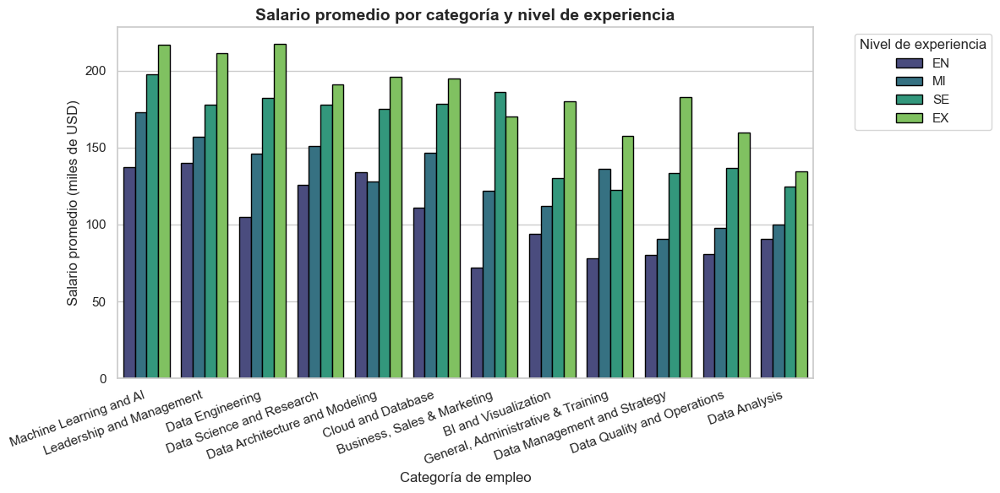

In [93]:
# Calcular promedio por categoría y nivel
avg_salary_cat_exp = (
    data_df.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles (k)
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# Ordenar categorías por salario promedio general
order = (
    avg_salary_cat_exp.groupby("job_category")["average_salary_k"]
    .mean()
    .sort_values(ascending=False)
    .index
)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=avg_salary_cat_exp,
    x="job_category",
    y="average_salary_k",
    hue="experience_level",
    order=order,
    palette="viridis",
    edgecolor="black"
)

plt.title("Salario promedio por categoría y nivel de experiencia", fontsize=14, fontweight="bold")
plt.xlabel("Categoría de empleo")
plt.ylabel("Salario promedio (miles de USD)")
plt.xticks(rotation=20, ha="right")
plt.legend(title="Nivel de experiencia", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [94]:
summary = (
    avg_salary_cat_exp.pivot(index="job_category", columns="experience_level", values="average_salary_k")
    .sort_values(by="EN", ascending=False)
    .round(1)
)

summary


experience_level,EN,MI,SE,EX
job_category,,,,
Leadership and Management,140.2,157.2,177.9,211.3
Machine Learning and AI,137.3,173.0,197.8,217.0
Data Architecture and Modeling,133.9,128.1,174.9,195.8
Data Science and Research,125.6,150.8,177.8,190.8
Cloud and Database,111.0,146.6,178.6,194.8
Data Engineering,105.0,146.2,182.0,217.3
BI and Visualization,93.8,112.2,129.9,179.8
Data Analysis,90.5,100.2,124.7,134.3
Data Quality and Operations,80.7,98.0,136.6,159.5


In [95]:
# Calcular el salario promedio por categoría y nivel
avg_salary_cat_exp = (
    data_df.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles de USD
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# Ordenar categorías por salario promedio global
cat_order = (
    avg_salary_cat_exp.groupby("job_category")["average_salary_k"]
    .mean()
    .sort_values(ascending=False)
    .index
)


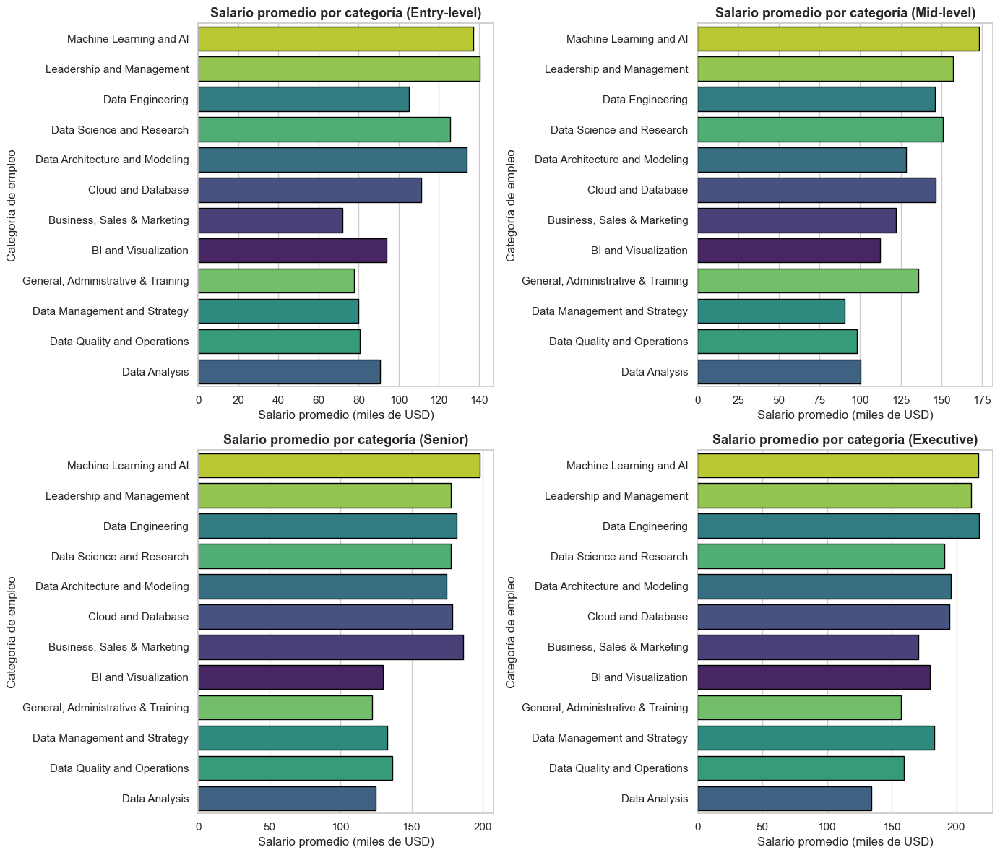

In [96]:
# Configurar el estilo
sns.set_style("whitegrid")
levels = ["EN", "MI", "SE", "EX"]
titles = {
    "EN": "Entry-level",
    "MI": "Mid-level",
    "SE": "Senior",
    "EX": "Executive"
}

plt.figure(figsize=(14, 12))

for i, lvl in enumerate(levels, 1):
    plt.subplot(2, 2, i)
    subset = avg_salary_cat_exp[avg_salary_cat_exp["experience_level"] == lvl]
    sns.barplot(
        data=subset,
        x="average_salary_k",
        y="job_category",
        hue="job_category",
        order=cat_order,
        palette="viridis",
        edgecolor="black"
    )
    plt.title(f"Salario promedio por categoría ({titles[lvl]})", fontsize=13, fontweight="bold")
    plt.xlabel("Salario promedio (miles de USD)")
    plt.ylabel("Categoría de empleo")
    plt.tight_layout()

plt.show()


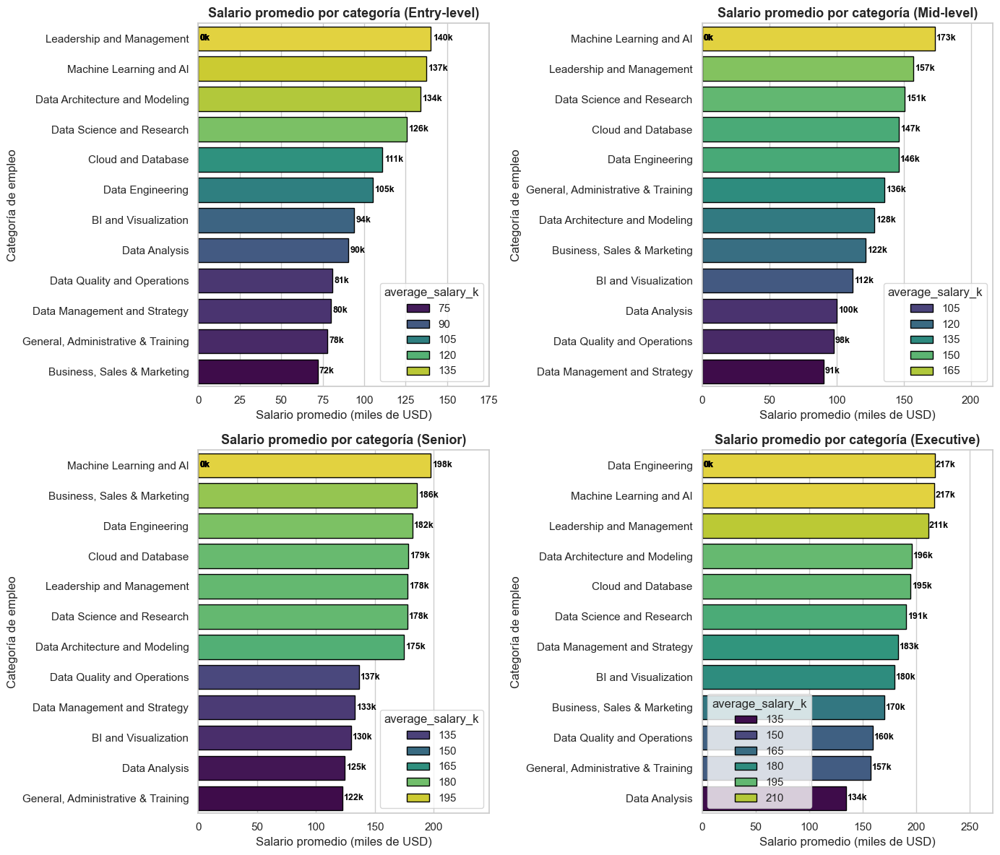

In [97]:
# === 1️⃣ Calcular salario promedio por categoría y nivel ===
avg_salary_cat_exp = (
    data_df.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles (k)
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# === 2️⃣ Configurar gráficos ===
sns.set_style("whitegrid")
levels = ["EN", "MI", "SE", "EX"]
titles = {
    "EN": "Entry-level",
    "MI": "Mid-level",
    "SE": "Senior",
    "EX": "Executive"
}

plt.figure(figsize=(14, 12))

# === 3️⃣ Graficar cada nivel ===
for i, lvl in enumerate(levels, 1):
    plt.subplot(2, 2, i)
    subset = avg_salary_cat_exp[avg_salary_cat_exp["experience_level"] == lvl]

    # 🔹 Ordenar por salario promedio descendente
    subset = subset.sort_values("average_salary_k", ascending=False)

    ax = sns.barplot(
        data=subset,
        x="average_salary_k",
        y="job_category",
        hue="average_salary_k",
        palette="viridis",
        edgecolor="black"
    )

    # === 4️⃣ Agregar etiquetas con valores ===
    for p in ax.patches:
        value = p.get_width()
        ax.text(
            value + 1,                                 # un poco a la derecha de la barra
            p.get_y() + p.get_height() / 2,            # centrado verticalmente
            f"{value:.0f}k",                           # formato: 120k
            ha="left", va="center",
            fontsize=9, fontweight="bold", color="black"
        )

    # === 5️⃣ Personalizar ===
    plt.title(f"Salario promedio por categoría ({titles[lvl]})", fontsize=13, fontweight="bold")
    plt.xlabel("Salario promedio (miles de USD)")
    plt.ylabel("Categoría de empleo")
    plt.xlim(0, subset["average_salary_k"].max() * 1.25)  # margen extra a la derecha
    plt.tight_layout()

plt.show()


In [98]:
# Pivotar para comparar EN vs SE
salary_growth = avg_salary_cat_exp.pivot(
    index="job_category",
    columns="experience_level",
    values="average_salary_k"
)

# Calcular porcentaje de aumento del salario de EN a SE
salary_growth["% Aumento EN→SE"] = (
    (salary_growth["SE"] - salary_growth["EN"]) / salary_growth["EN"] * 100
).round(1)

# Ordenar de mayor a menor crecimiento
salary_growth_sorted = salary_growth.sort_values("% Aumento EN→SE", ascending=False)

salary_growth_sorted[["EN", "SE", "% Aumento EN→SE"]].head(10)


experience_level,EN,SE,% Aumento EN→SE
job_category,,,
"Business, Sales & Marketing",71.9,186.1,158.8
Data Engineering,105.0,182.0,73.3
Data Quality and Operations,80.7,136.6,69.3
Data Management and Strategy,80.0,133.2,66.5
Cloud and Database,111.0,178.6,60.9
"General, Administrative & Training",77.8,122.5,57.5
Machine Learning and AI,137.3,197.8,44.1
Data Science and Research,125.6,177.8,41.6
BI and Visualization,93.8,129.9,38.5


In [99]:
# === 1️⃣ Promedio por categoría y nivel ===
avg_salary_cat_exp = (
    data_df.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# === 2️⃣ Pivotar tabla para tener una columna por nivel ===
salary_matrix = avg_salary_cat_exp.pivot(
    index="job_category",
    columns="experience_level",
    values="average_salary_k"
).copy()

# === 3️⃣ Calcular crecimiento porcentual entre niveles consecutivos ===
salary_matrix["% EN→MI"] = (
    (salary_matrix["MI"] - salary_matrix["EN"]) / salary_matrix["EN"] * 100
).round(1)

salary_matrix["% MI→SE"] = (
    (salary_matrix["SE"] - salary_matrix["MI"]) / salary_matrix["MI"] * 100
).round(1)

salary_matrix["% SE→EX"] = (
    (salary_matrix["EX"] - salary_matrix["SE"]) / salary_matrix["SE"] * 100
).round(1)

# === 4️⃣ Calcular crecimiento total (Entry → Executive) ===
salary_matrix["% EN→EX (Total)"] = (
    (salary_matrix["EX"] - salary_matrix["EN"]) / salary_matrix["EN"] * 100
).round(1)

# === 5️⃣ Ordenar por crecimiento total descendente ===
salary_growth = salary_matrix.sort_values("% EN→EX (Total)", ascending=False)

# === 6️⃣ Mostrar tabla final ===
salary_growth = salary_growth[
    ["EN", "MI", "SE", "EX", "% EN→MI", "% MI→SE", "% SE→EX", "% EN→EX (Total)"]
]

salary_growth


experience_level,EN,MI,SE,EX,% EN→MI,% MI→SE,% SE→EX,% EN→EX (Total)
job_category,,,,,,,,
"Business, Sales & Marketing",71.9,121.9,186.1,170.4,69.5,52.7,-8.4,137.0
Data Management and Strategy,80.0,90.6,133.2,183.0,13.2,47.0,37.4,128.8
Data Engineering,105.0,146.2,182.0,217.3,39.2,24.5,19.4,107.0
"General, Administrative & Training",77.8,135.9,122.5,157.4,74.7,-9.9,28.5,102.3
Data Quality and Operations,80.7,98.0,136.6,159.5,21.4,39.4,16.8,97.6
BI and Visualization,93.8,112.2,129.9,179.8,19.6,15.8,38.4,91.7
Cloud and Database,111.0,146.6,178.6,194.8,32.1,21.8,9.1,75.5
Machine Learning and AI,137.3,173.0,197.8,217.0,26.0,14.3,9.7,58.0
Data Science and Research,125.6,150.8,177.8,190.8,20.1,17.9,7.3,51.9


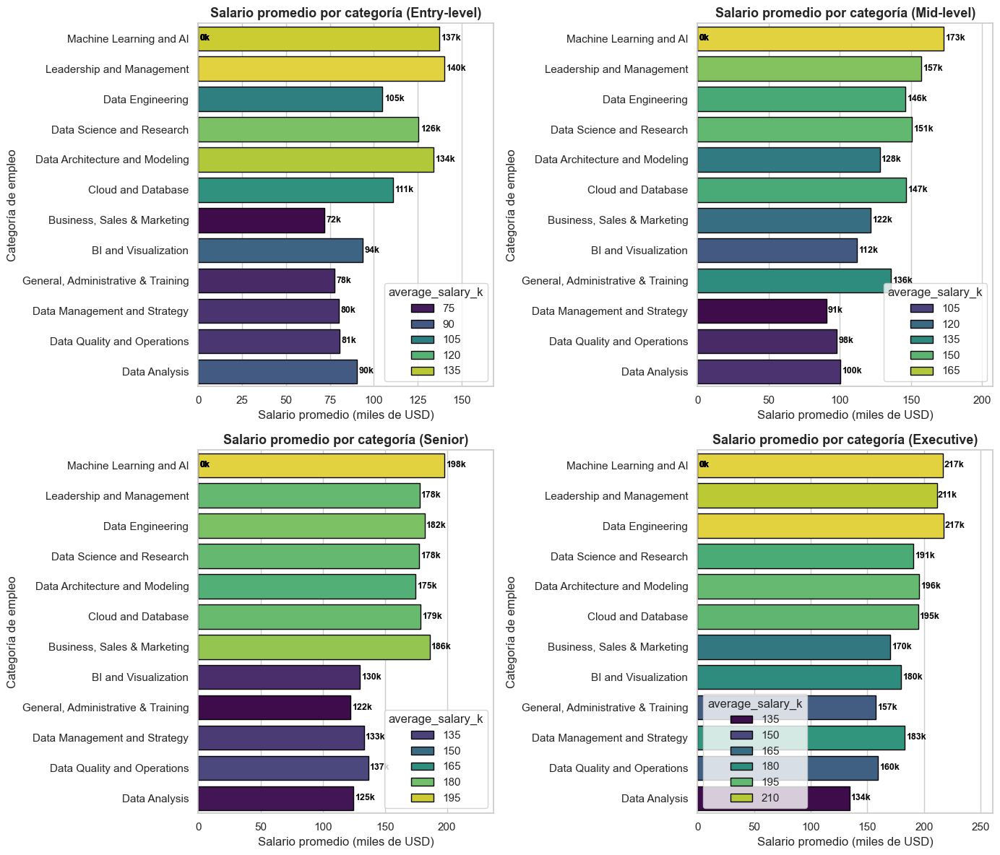

In [100]:
# === 1️⃣ Calcular salario promedio por categoría y nivel ===
avg_salary_cat_exp = (
    data_df.groupby(["job_category", "experience_level"], observed=False)["salary_in_usd"]
    .mean()
    .reset_index(name="average_salary")
)

# Convertir a miles (k)
avg_salary_cat_exp["average_salary_k"] = (avg_salary_cat_exp["average_salary"] / 1000).round(1)

# Ordenar categorías por salario promedio general
cat_order = (
    avg_salary_cat_exp.groupby("job_category")["average_salary_k"]
    .mean()
    .sort_values(ascending=False)
    .index
)

# === 2️⃣ Configurar gráficos ===
sns.set_style("whitegrid")
levels = ["EN", "MI", "SE", "EX"]
titles = {
    "EN": "Entry-level",
    "MI": "Mid-level",
    "SE": "Senior",
    "EX": "Executive"
}

plt.figure(figsize=(14, 12))

# === 3️⃣ Graficar cada nivel en un subplot ===
for i, lvl in enumerate(levels, 1):
    plt.subplot(2, 2, i)
    subset = avg_salary_cat_exp[avg_salary_cat_exp["experience_level"] == lvl]

    ax = sns.barplot(
        data=subset,
        x="average_salary_k",
        y="job_category",
        hue="average_salary_k",
        order=cat_order,
        palette="viridis",
        edgecolor="black"
    )

    # === 4️⃣ Agregar etiquetas con valores ===
    for p in ax.patches:
        value = p.get_width()
        ax.text(
            value + 1,                                 # Posición X (ligeramente a la derecha de la barra)
            p.get_y() + p.get_height() / 2,            # Centrado verticalmente
            f"{value:.0f}k",                           # Formato (ej: 125k)
            ha="left", va="center",
            fontsize=9, fontweight="bold", color="black"
        )

    # === 5️⃣ Personalizar cada gráfico ===
    plt.title(f"Salario promedio por categoría ({titles[lvl]})", fontsize=13, fontweight="bold")
    plt.xlabel("Salario promedio (miles de USD)")
    plt.ylabel("Categoría de empleo")
    plt.xlim(0, subset["average_salary_k"].max() * 1.2)  # Margen extra a la derecha
    plt.tight_layout()

plt.show()
